# Single cell RNA-seq -- principles and processing (Python version)

## Introduction

Now that you're comfortable with bulk RNA-seq data analysis, we'll shift our focus to the rapidly developing landscape of single cell RNA-seq (scRNA-seq). In this lecture, you'll learn about the underlying technology and we'll demonstrate how to process raw single cell data directly on your laptop (!) for importing into R/bioconductor.

With your data already preprocessed with Kallisto-Bustools, you're now ready to import into R and use a variety of packages to filter, plot and analyze your data.

### Learning objectives

* Understand droplet-based scRNA-seq technology
* Be able to compare and contrast single cell and bulk RNA-seq methods
* Understand cost and experimental design considerations for scRNA-seq experiments.
* Familiarity with multiplexed single cell assays (CITE-seq, 'multiome', TEA-seq)
* Be able to define common terms and concepts in single cell genomics
* Use Kallisto-BUStools to preprocess raw scRNA-seq data (via [kb-python](https://www.kallistobus.tools/))

In the second part of the course:

* Be able to import preprocessed data ~~into R and create a Seurat object~~
* Carry out filtering using ~~[DropUtils](https://bioconductor.org/packages/release/bioc/html/DropletUtils.html)~~[`dropkick`](https://github.com/KenLauLab/dropkick)
* Generate a Quality Control report of your scRNA-seq data ~~directly within R~~
* Use standard QC metrics and plots to filter your data
* Generate clusters and visualize via UMAP dimensional reduction
* Find cluster-specific marker genes ~~with Seurat~~
~~* Annotate unknown clusters using public databases and [CellAssign](https://www.rdocumentation.org/packages/cellassign/) and [SingleR](https://bioconductor.org/packages/release/bioc/html/SingleR.html)~~
~~* Integrate multiple samples and use sample details to analyze integrated data, e.g., compared different conditions in different samples~~

### Information

The notebook was written by S. Wieckowski and is based on different notebooks and courses:

- The kallisto tutoriam [Analysis of single-cell RNA-seq data: building and annotating an atlas](https://www.kallistobus.tools/tutorials/kb_building_atlas/python/kb_analysis_0_python/) notebook
- The Scanpy tutorial [Preprocessing and clustering 3k PBMCs](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)
- [Analysis of scRNA-seq data using R lecture](https://diytranscriptomics.com/project/lecture-14)

### Reading

* [Modular and efficient pre-processing of single-cell RNA-seq](https://doi.org/10.1101/673285) - describes the full Kallisto-Bustools workflow for memory efficient processing of scRNA-seq data.
* [The barcode, UMI, set format and BUStools, Bioinformatics](https://doi.org/10.1093/bioinformatics/btz279) - Describes the BUS format as an efficient and platform-independent way to store information from scRNA-seq data.
 *[A curated database reveals trends in single-cell transcriptomics](https://doi.org/10.1093/database/baaa073) - describes the growing collection of scRNA-seq experiments found [here](https://diytranscriptomics.com/project/www.nxn.se/single-cell-studies/gui), which I used to produce two of the plots in the slides for this lecture.
* [EmptyDrops: distinguishing cells from empty droplets in droplet-based single-cell RNA sequencing data..](https://doi.org/10.1186/s13059-019-1662-y) - This is the paper describing the DropletUtils package that we use in this lecture to identify empty drops.
* [Sarah Ennis' Github repo for preprocessing scRNA-seq data](https://github.com/Sarah145/scRNA_pre_process) - This is the source of the custom script we use to generate the CellRanger-esque html QC report.
* [Probabilistic cell-type assignment of single-cell RNA-seq for tumor microenvironment profiling](https://pubmed.ncbi.nlm.nih.gov/31501550/) - Describes the CellAssign algorithm and R package that we use to identify clusters.
* [Reference-based analysis of lung single-cell sequencing reveals a transitional profibrotic macrophage](https://doi.org/10.1038/s41590-018-0276-y) - describes the SingleR and celldex packages that allow us to leverage bulk RNA-seq data in public repositories to curate clusters in our scRNA-seq.
* [Comprehensive Integration of Single-Cell Data](https://doi.org/10.1016/j.cell.2019.05.031) - This 2019 paper describes the underlying statistical approach for data integration in Seurat.

## Setup

### Install all the python packages

On a Windows machine, kb-python will only work on WSL, see the [explanations on stackoverflow](https://stackoverflow.com/questions/60197890/why-does-installing-pysam-python-package-fail). Install the package as follow:
```bash
# prior to the installation of kb_python, install PySAM
pip install pysam
# there may be some error messages pointing to missing packages, e.g.,
sudo apt install liblzma-dev
sudo apt install libbz2-dev

# finally check the list of supported technologies
kb --list
```

In [4]:
!pip install --quiet matplotlib scikit-learn numpy scipy
!pip install -U --quiet kb_python # try to get the latest version using the -U arg
!pip install --quiet scanpy
!pip install --quiet leidenalg louvain scanpy
!pip install --quiet dropkick
# see the message errors for any missing linux package

In [5]:
!kb info

kb_python 0.27.3
kallisto: 0.48.0 (/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/kb_python/bins/linux/kallisto/kallisto)
bustools: 0.41.0 (/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/kb_python/bins/linux/bustools/bustools)
kb is a python package for rapidly pre-processing single-cell RNA-seq data. It
is a wrapper for the methods described in [2].

The goal of the wrapper is to simplify downloading and running of the kallisto
[1] and bustools [2] programs. It was inspired by Sten Linnarsson’s loompy
fromfq command (http://linnarssonlab.org/loompy/kallisto/index.html)

The kb program consists of two parts:

The `kb ref` command builds or downloads a species-specific index for
pseudoalignment of reads. This command must be run prior to `kb count`, and it
runs the `kallisto index` [1].

The `kb count` command runs the kallisto [1] and bustools [2] programs. It can
be used for pre-processing of data from a variety of single-cell RNA-se

### Download the data

The data consist of *3k PBMCs from a Healthy Donor* and are freely available from 10x Genomics ([here](http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz) from this [webpage](https://support.10xgenomics.com/single-cell-gene-expression/datasets/1.1.0/pbmc3k)). On a unix system, you can uncomment and run the following to download and unpack the data. The last line creates a directory for writing processed data.

```bash
!mkdir data
!wget http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz -O data/pbmc3k_filtered_gene_bc_matrices.tar.gz
!cd data; tar -xzf pbmc3k_filtered_gene_bc_matrices.tar.gz
```

```powershell
!Invoke-WebRequest http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz -OutFile ./data/pbmc3k_filtered_gene_bc_matrices.tar.gz
!7z x .\pbmc3k_filtered_gene_bc_matrices.tar.gz | 7z x .\pbmc3k_filtered_gene_bc_matrices.tar
```

* ~~[Download raw files](https://drive.google.com/drive/folders/1DbLRO4kv-y3W06adFR26RdSaDPmfB4UA?usp=sharing). You will need about 5Gb of storage space on your harddrive to accomodate this download. Please do not uncompress these files (leave them as .gz files). This is data from 1000 peripheral blood mononuclear cells (PBMCs) and is one of the sample datasets provided by 10X Genomics [here](https://bit.ly/10xPBMC_small). I merged the separate lane files to make this simpler to work with for the course. Of note, the _sample index read_ is not used here as there is a single type of sample, see [more information](https://kb.10xgenomics.com/hc/en-us/articles/115004553003-How-do-I-demultiplex-a-run-with-no-index-sequences-).~~
* [pre-processed data for 1000 PBMCs](https://drive.google.com/drive/folders/1RO45z5DEVpuaq5qwlF5QNdhc0tbGVK7l?usp=sharing) - _You only need to download this if you were unable to use kb-python to process raw scRNA-seq data_
* Download the [human genome data from Ensembl](http://ftp.ensembl.org/pub/release-108/fasta/homo_sapiens/dna/Homo_sapiens.GRCh38.dna.primary_assembly.fa.gz), and the [corresponding annotations](http://ftp.ensembl.org/pub/release-108/gtf/homo_sapiens/Homo_sapiens.GRCh38.108.gtf.gz). The latest genome and annotation files for every species on ensembl can be found with the gget command-line tool `gget ref -w dna,gtf homo_sapiens`. Another option is to use `kb ref -d human` to download a prebuild index file, as described later
* [t2g.txt](http://diytranscriptomics.github.io/Code/files/t2g.txt) - this is a human transcript-to-gene mapping file that we will use with Kallisto-Bustools to preprocess our data. _This file is easy to generate with kb ref (see later), but downloading it now will save you some time_

### Prepare the reference files scRNA-seq

#### Build locally from genome and annotation files [as described elsewhere](https://github.com/pachterlab/kb_python)

```bash
kb ref \
-i Homo_sapiens.GRCh38.cdna.all.index \
-g t2g.txt \
-f1 transcriptome.fa \
Homo_sapiens.GRCh38.dna.primary_assembly.fa.gz \
Homo_sapiens.GRCh38.108.gtf.gz
```

The _de novo_ building of the index can take a couple of minutes.
Note -- See the [issue on generating t2g.txt and index](https://github.com/pachterlab/kb_python/issues/180)

#### Without genome and annotations files

This data consists of peripheral blood mononuclear cells from a human, so we download the human index.

In [7]:
!kb ref -d human -i index.idx -g t2g.txt -f1 transcriptome.fasta

[2022-11-30 02:16:14,411]    INFO [download] Downloading files for human from https://caltech.box.com/shared/static/v1nm7lpnqz5syh8dyzdk2zs8bglncfib.gz to tmp/v1nm7lpnqz5syh8dyzdk2zs8bglncfib.gz
100%|██████████████████████████████████████| 2.23G/2.23G [03:40<00:00, 10.8MB/s]
[2022-11-30 02:19:55,361]    INFO [download] Extracting files from tmp/v1nm7lpnqz5syh8dyzdk2zs8bglncfib.gz


## Pseudoalignment and counting

### Run kallisto and bustools

We are using the sequencing data from the last tutorial. Think also about streamlining the analysis.

In addition to unfiltered counts, different diagnostic files are bieng generated and will be used later for the QC.

In [14]:
!kb count \
-i index.idx \
-g t2g.txt \
--overwrite \
-x 10XV3 \
--cellranger \
-o output \
--filter bustools \
-t 8 \
../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L001_R1_001.fastq.gz \
../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L001_R2_001.fastq.gz \
../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L002_R1_001.fastq.gz \
../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L002_R2_001.fastq.gz

[2022-11-30 02:35:08,359]    INFO [count] Using index index.idx to generate BUS file to output from
[2022-11-30 02:35:08,359]    INFO [count]         ../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L001_R1_001.fastq.gz
[2022-11-30 02:35:08,359]    INFO [count]         ../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L001_R2_001.fastq.gz
[2022-11-30 02:35:08,359]    INFO [count]         ../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L002_R1_001.fastq.gz
[2022-11-30 02:35:08,359]    INFO [count]         ../docs/tutorials/kb_building_atlas/python/pbmc_1k_v3_fastqs/pbmc_1k_v3_S1_L002_R2_001.fastq.gz
[2022-11-30 02:38:22,581]    INFO [count] Sorting BUS file output/output.bus to output/tmp/output.s.bus
[2022-11-30 02:38:47,999]    INFO [count] Whitelist not provided
[2022-11-30 02:38:48,000]    INFO [count] Copying pre-packaged 10XV3 whitelist to output
[2022-11-30 02:38:49,189]    INFO [count] Inspecting BUS f

## Basic QC

### Import packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context

In [2]:
sc.settings.verbosity = 2             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80)

sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.9.3 pandas==1.5.2 scikit-learn==1.1.3 statsmodels==0.13.5 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.8


### Read in the count data

Read in the count matrix into an [AnnData](https://anndata.readthedocs.io/en/latest/anndata.AnnData.html) object, which holds many slots for annotations and different representations of the data. It also comes with its own HDF5-based file format: `.h5ad`.

In [3]:
results_file = 'pbmc3k.h5ad' # the file that will store the analysis results

In [484]:
# load the unfiltered matrix

adata = sc.read_10x_mtx(
    './output/counts_unfiltered/cellranger', # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

... reading from cache file cache/output-counts_unfiltered-cellranger-matrix.h5ad


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/anndata/utils.py:111: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


In the case we need to concatenate multiple data from h5 files, there is a convenient tool in `scanpy`

```python
data1 = sc.read_10x_h5('lung1.h5')
data2 = sc.read_10x_h5('lung2.h5')
data3 = sc.read_10x_h5('lung3.h5')

data1.var_names_make_unique()
data2.var_names_make_unique()
data3.var_names_make_unique()

adata = data1.concatenate(data2, data3, batch_key = "Sample")
``` 

In [259]:
adata.var_names_make_unique() # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`
# adata.obs_names_make_unique()

In [485]:
adata

AnnData object with n_obs × n_vars = 250603 × 60623
    var: 'gene_ids'

### Test for library saturation

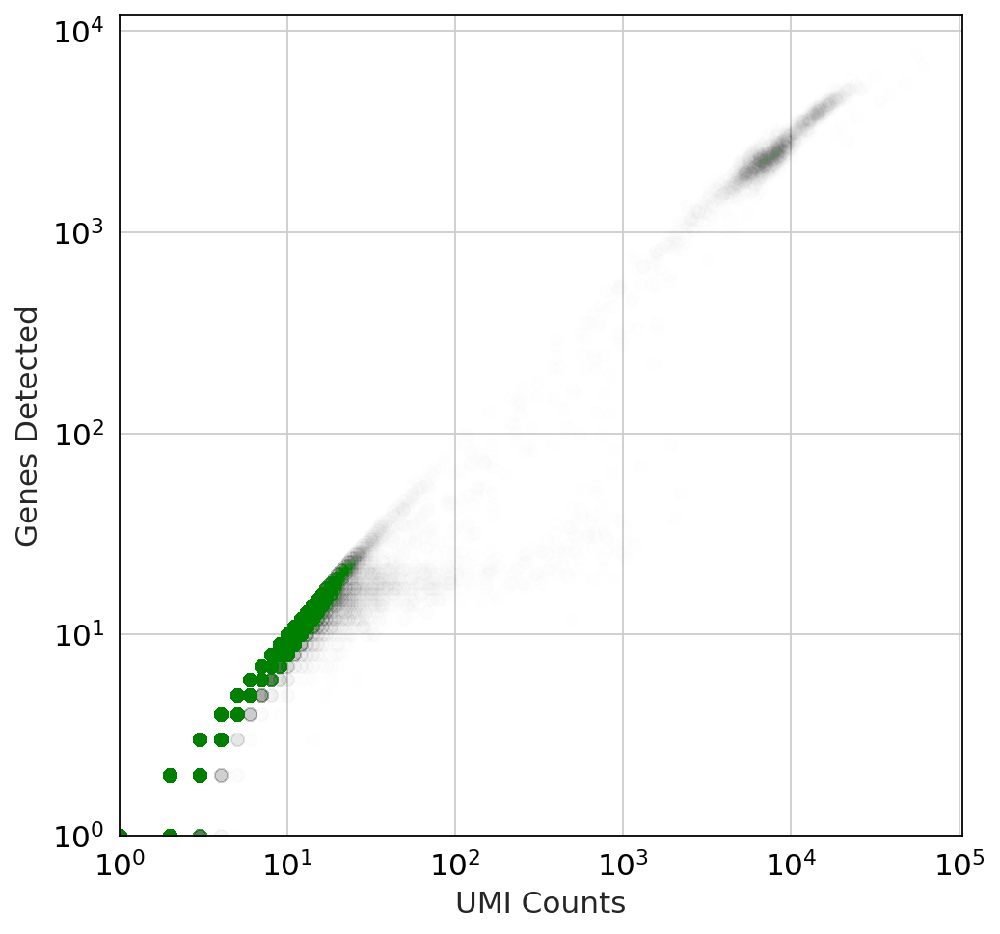

In [489]:
# Create a plot showing genes detected as a function of UMI counts.
fig, ax = plt.subplots(figsize=(7, 7))

x = np.asarray(adata.X.sum(axis=1))[:,0]
y = np.asarray(np.sum(adata.X>0, axis=1))[:,0]

ax.scatter(x, y, color="green", alpha=0.005)
ax.set_xlabel("UMI Counts")
ax.set_ylabel("Genes Detected")
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1)
ax.set_ylim(1);

### Examine the knee plot

The "knee plot" was introduced in the Drop-seq paper: 
- Macosko et al., [Highly parallel genome-wide expression profiling of individual cells using nanoliter droplets](https://www.cell.com/fulltext/S0092-8674(15)00549-8), 2015. DOI:10.1016/j.cell.2015.05.002

In this plot cells are ordered by the number of UMI counts associated to them (shown on the *x*-axis), and the fraction of droplets with at least that number of cells is shown on the *y*-axis:

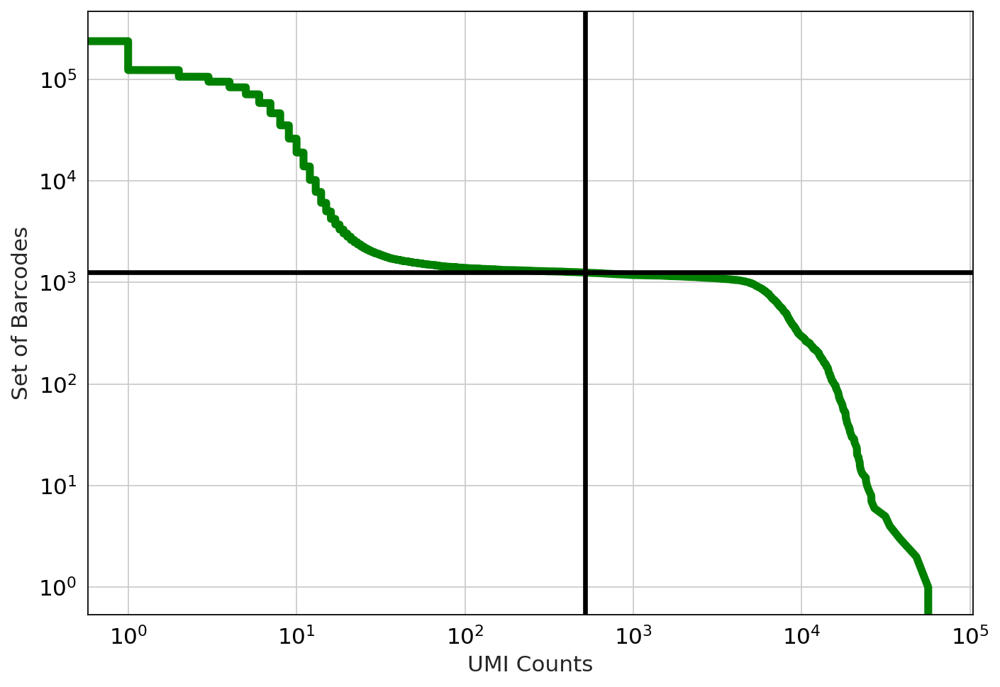

In [492]:
expected_num_cells = 1250
knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]

fig, ax = plt.subplots(figsize=(10, 7))

ax.loglog(knee, range(len(knee)), linewidth=5, color="g")
ax.axvline(x=knee[expected_num_cells], linewidth=3, color="k")
ax.axhline(y=expected_num_cells, linewidth=3, color="k")

ax.set_xlabel("UMI Counts")
ax.set_ylabel("Set of Barcodes")

plt.grid(True, which="major");

### Using `dropkick` for automated cell filtering

`dropkick` works primarily with [**Scanpy**](https://icb-scanpy.readthedocs-hosted.com/en/stable/)'s `AnnData` objects, and accepts input files in `.h5ad` or flat (`.csv`, `.tsv`) format. It also writes outputs to `.h5ad` files when called from the command line.

In [493]:
import dropkick as dk

#### Plot QC metrics (recommended)

The `qc` module has functions for plotting total UMI distribution and ambient genes, to give an idea of overall data quality and amenability to `dropkick` filtering. 

filtered out 248408 cells that have less than 20 genes expressed
filtered out 31018 genes that are detected in less than 1 counts
Ignoring 248408 barcodes with less than 20 genes detected
Ignoring 31018 genes with zero total counts
Top 10 ambient genes have dropout rates between 23.827 and 30.615 percent:
	['MT-CO3', 'MT-CO2', 'MT-RNR2', 'MT-CO1', 'MT-ATP6', 'MALAT1', 'MT-ND4', 'MT-CYB', 'MT-RNR1', 'MT-ND1']
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


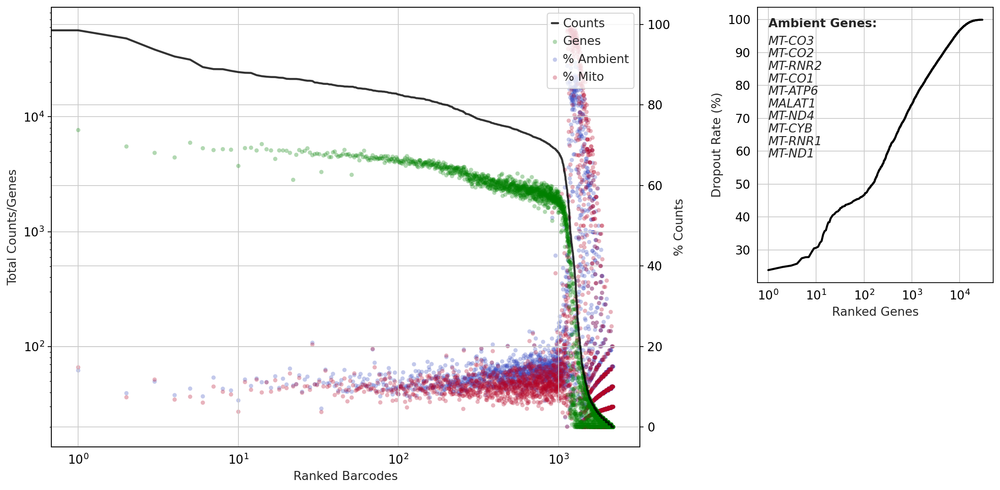

In [494]:
# simple preprocessing of anndata object to get metrics for plot
adata = dk.recipe_dropkick(adata, min_genes=20, n_hvgs=None, X_final="raw_counts", filter=True)
qc_plt = dk.qc_summary(adata)

We can see from the total counts profile (top) that this sample has relatively low background ("empty" droplets), as indicated by the steep dropoff in counts and genes around barcode 1,100. Note the number of cells and genes filtered out by `dropkick` in the 

The dropout rate distribution also looks pretty good, with a steep increase in dropout rate following the first few highly-expressed mitochondrial genes.

In [495]:
adata

AnnData object with n_obs × n_vars = 2195 × 29605
    obs: 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ambient', 'arcsinh_total_counts', 'arcsinh_n_genes_by_counts'
    var: 'gene_ids', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'total_counts', 'mean', 'std'
    layers: 'raw_counts', 'arcsinh_norm'

#### Run `dropkick` pipeline function

This tool preprocesses the data to automatically calculate thresholds on global metrics, then trains a [glmnet](https://web.stanford.edu/~hastie/glmnet/glmnet_alpha.html)-style logistic regression model to determine scores and labels for each barcode in the dataset describing likelihood of being a real cell (rather than empty droplet). The dropkick model is returned (`adata_model`), and contains [scikit-learn](https://scikit-learn.org/stable/)-style attributes for further exploration. Scores and metrics are also added to the original AnnData object as part of the `dk.dropkick` function.

The `n_jobs` parameter will parallelize the model training. Since the default is 5-fold cross-validation, we'll use 5 cores to quickly train **dropkick**.

In [264]:
adata_model = dk.dropkick(adata, min_genes=20, n_jobs=5)

Top 10 ambient genes have dropout rates between 23.827 and 30.615 percent:
	['MT-CO3', 'MT-CO2', 'MT-RNR2', 'MT-CO1', 'MT-ATP6', 'MALAT1', 'MT-ND4', 'MT-CYB', 'MT-RNR1', 'MT-ND1']
normalizing counts per cell
    finished (0:00:00)
Determining 2000 highly variable genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Setting arcsinh_norm layer to .X
Thresholding on heuristics for training labels:
	['arcsinh_n_genes_by_counts']
Ignoring 961 barcodes below first threshold on arcsinh_n_genes_by_counts
Training dropkick with alphas:
	[0.1]


[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float v

[Parallel(n_jobs=5)]: Done   2 out of   5 | elapsed:    7.3s remaining:   10.9s


Chosen lambda value:
	[0.5420689]
Assigning scores and labels
Done!



[Parallel(n_jobs=5)]: Done   5 out of   5 | elapsed:    7.8s finished


#### Explore output

Running **dropkick** interactively adds the following attributes to the input `AnnData` object:
* `.obs['dropkick_score']`
    * Probability of being a real cell
    * Values closer to 0 indicate empty droplets with high ambient RNA content
* `.obs['dropkick_label']`
    * Binary label generated by using cutoff of 0.5 on `'dropkick_score'`
    * Dropkick's best estimate of a "good" dataset
    * User is encouraged to adjust the cutoff according to whether they are more concerned with *false negatives* or *false positives*
* `.obs[<metrics>]`
    * Metrics used for thresholding (`metrics` parameter, default `['arcsinh_n_genes_by_counts']`, are kept
* `.var['dropkick_coef']`
    * Logistic regression coefficient values for each highly variable gene (HVG) determined by the **dropkick** pipeline
* `.uns['dropkick_thresholds']`
    * Dictionary of global metrics thresholded by **dropkick** with the resulting threshold values and directions for good training cells
* `.uns['dropkick_args']`
    * Dictionary of all arguments used to run the pipeline

In [265]:
adata

AnnData object with n_obs × n_vars = 2195 × 29605
    obs: 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ambient', 'arcsinh_total_counts', 'arcsinh_n_genes_by_counts', 'dropkick_score', 'dropkick_label'
    var: 'gene_ids', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'total_counts', 'mean', 'std', 'dropkick_coef'
    uns: 'dropkick_thresholds', 'dropkick_args'
    layers: 'raw_counts', 'arcsinh_norm'

We can look at the distribution of **dropkick** scores for all barcodes with greater than 50 total genes detected (well below average for real cells; removes noise from hundreds of thousands of junk barcodes kept by the 10X CellRanger pipeline).

The `score_plot` function displays these barcodes in a scatter plot of **ambient percentage** (as calculated in the `qc_summary` plot above) versus **total genes** detected for each cell. The automated thresholds on the latter heuristic are overlayed to show the initial training labels given to the **dropkick** model.

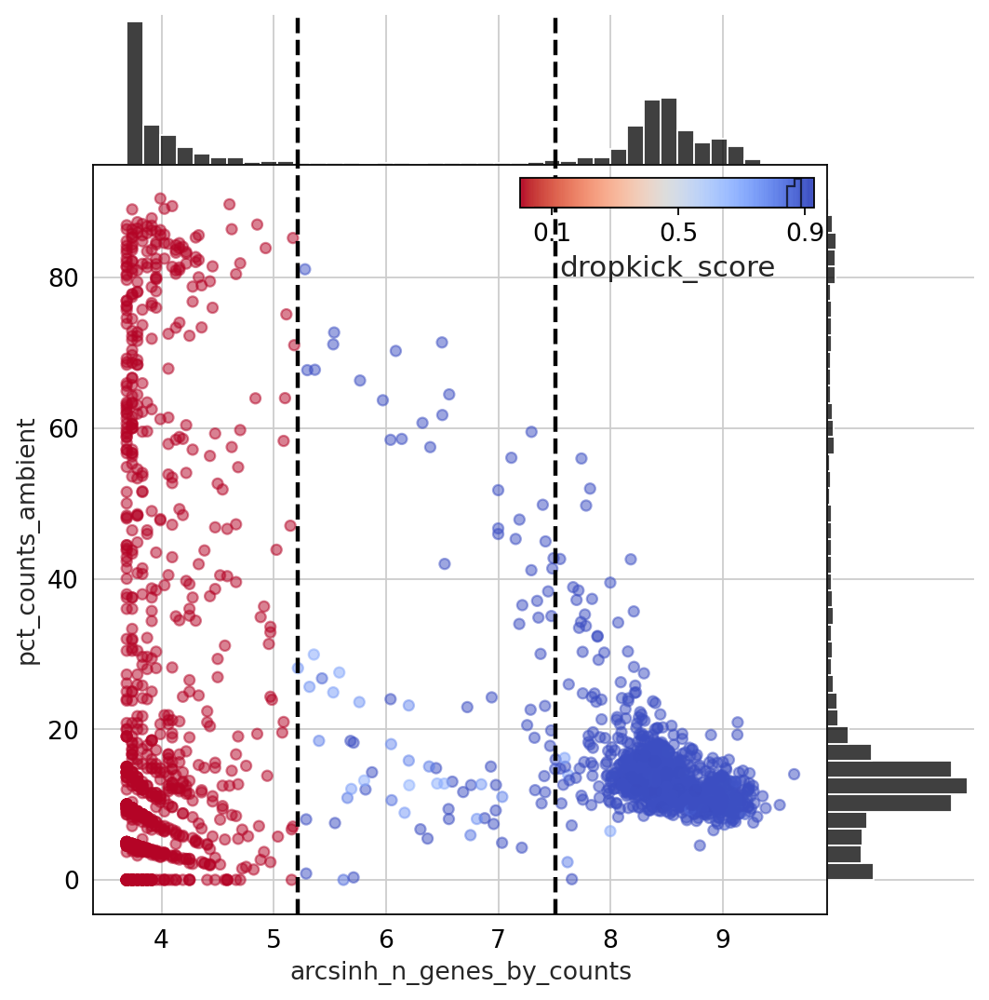

In [266]:
score_plt = dk.score_plot(adata)

We can list the top **dropkick** gene coefficients for both good cells (highly positive) and putative empty droplets (highly negative) with `coef_inventory`.

In [267]:
dk.coef_inventory(adata)


Top HVGs by coefficient value (good cells):
ELOB          0.014502
AL035078.1    0.000000
NDUFS8        0.000000
COPS6         0.000000
POLR2J        0.000000
ME2           0.000000
PCNP          0.000000
CNOT2         0.000000
EIF6          0.000000
MRPL54        0.000000
Name: dropkick_coef, dtype: float64

Bottom HVGs by coefficient value (bad droplets):
NRGN         -0.059018
PPBP         -0.040133
PF4          -0.033341
AL162424.1   -0.032294
ITGA2B       -0.027815
IGFBP2       -0.021228
ANO6         -0.012897
PF4V1        -0.011544
HIST1H2BJ    -0.001234
AL035078.1    0.000000
Name: dropkick_coef, dtype: float64

1990 coefficients equal to zero. Model sparsity: 99.5 %



Now, let's take the putative real cells using **dropkick** labels and visualize our resulting, filtered dataset.

In [268]:
# make a copy of our AnnData object, keeping only barcodes selected by dropkick
adata_dropkicked = adata[
    (adata.obs.dropkick_label=="True"),
    :].copy()
adata_dropkicked.shape

(1234, 29605)

For comparison, filtering using `emptyDrops` in R gave an estimated number of cells of 1222 with 29,584 total genes detected, with 90.88% counts in cells, a median counts per cell of 7244 and a median genes per cell of 2352.

In [269]:
adata_dropkicked

AnnData object with n_obs × n_vars = 1234 × 29605
    obs: 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ambient', 'arcsinh_total_counts', 'arcsinh_n_genes_by_counts', 'dropkick_score', 'dropkick_label'
    var: 'gene_ids', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'total_counts', 'mean', 'std', 'dropkick_coef'
    uns: 'dropkick_thresholds', 'dropkick_args'
    layers: 'raw_counts', 'arcsinh_norm'

### Filtering

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

normalizing counts per cell
    finished (0:00:00)


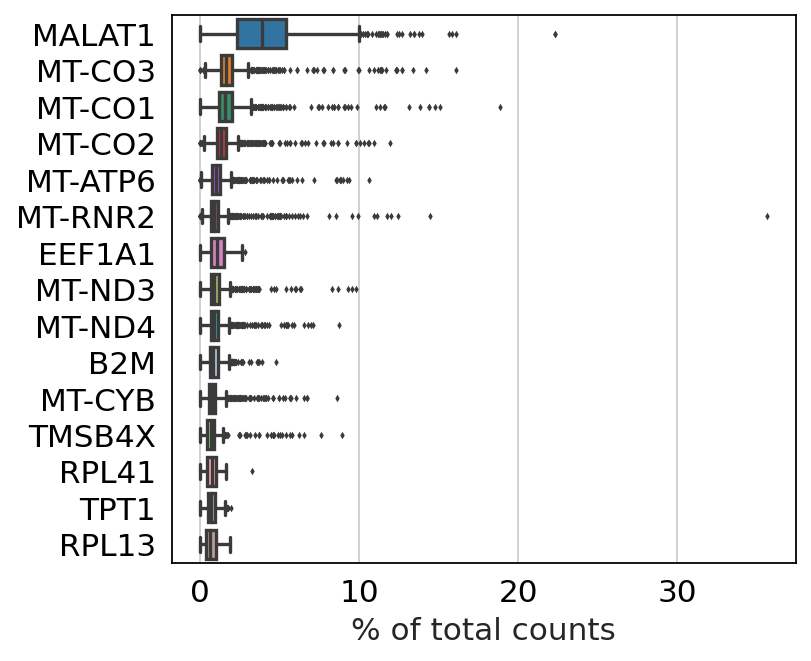

In [270]:
sc.pl.highest_expr_genes(adata_dropkicked, n_top=15, )

In [271]:
# marking mitochondrial genes differently seems to give the same
adata_dropkicked.var['mt'] = adata_dropkicked.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_dropkicked, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

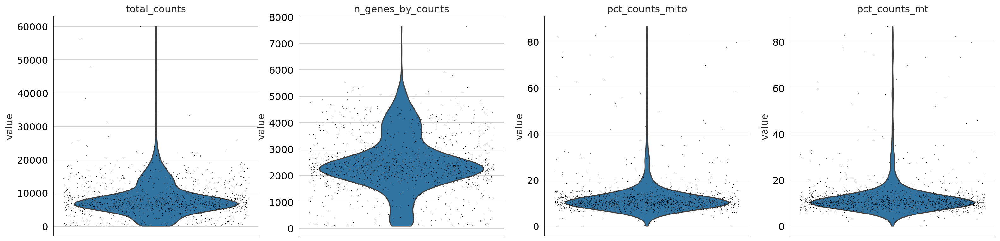

In [272]:
sc.pl.violin(
    adata_dropkicked,
    ['total_counts', 'n_genes_by_counts', 'pct_counts_mito', 'pct_counts_mt'],
    jitter=0.45,
    multi_panel=True,
)

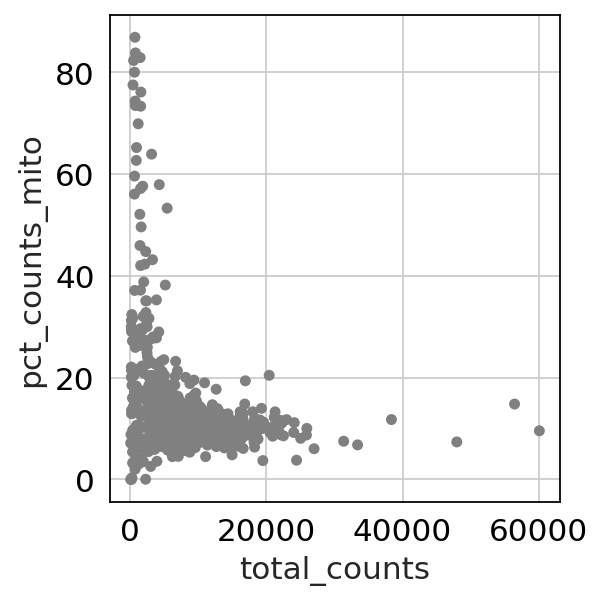

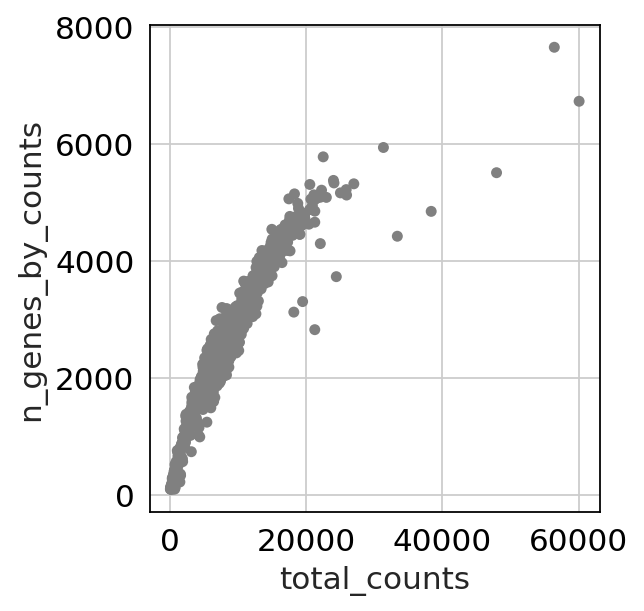

In [273]:
sc.pl.scatter(adata_dropkicked, x='total_counts', y='pct_counts_mito')
sc.pl.scatter(adata_dropkicked, x='total_counts', y='n_genes_by_counts')

May still need some more filtering, e.g., doublets with 2+ cells per drop, or potentially dead cells with high mitochodrial gene load, like done in R:

```R
pbmc.1k.seurat <- subset(
  pbmc.1k.seurat,
  subset =                                 # removal of outliers, i.e., droplets with 2+ cells
  nCount_RNA < 20000 & nCount_RNA > 1000 & # arbitrary number of UMIs, may be different from exp to exp
  nFeature_RNA > 1000 & percent.mt < 20    # may be dead cells
  )
```

In [274]:
# filtering by slicing the AnnData object
adata_filtered = adata_dropkicked[
    (adata_dropkicked.obs.n_genes_by_counts > 1000)
    &
    (adata_dropkicked.obs.total_counts < 25000)
    &
    (adata_dropkicked.obs.total_counts > 1000)
    &
    (adata_dropkicked.obs.pct_counts_mito < 25)
    ,:].copy()

adata_filtered.shape

(1104, 29605)

In [275]:
adata_dropkicked.shape

(1234, 29605)

In [276]:
adata.shape # this was after the prefiltering using `dropkick_recipe` on the original adata

(2195, 29605)

Using `Seurat` in R, the filtered dataset with stricter thresholds led to the selection of 1064 cells and 23850 features. Of note, QC finding of outlier peaks in the number of genes, the count depth and the fraction of mitochondrial reads was done **separately**, in contrast here, the covariates are considered **jointly**. Thresholds should be set as permissive as possible to avoid filtering out viable cell populations unintentionally.

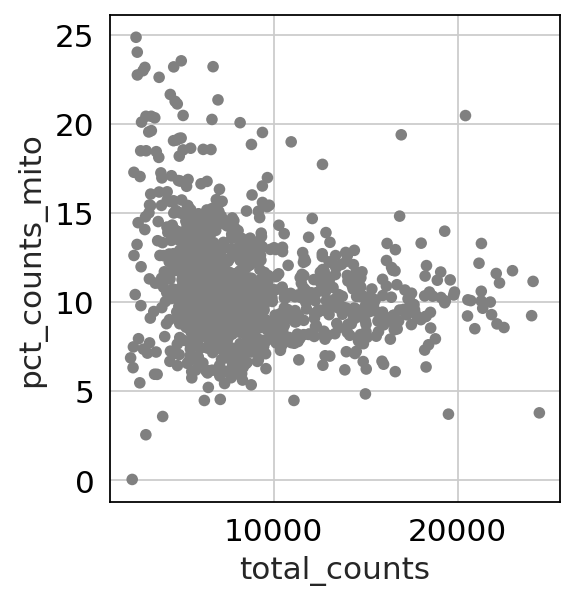

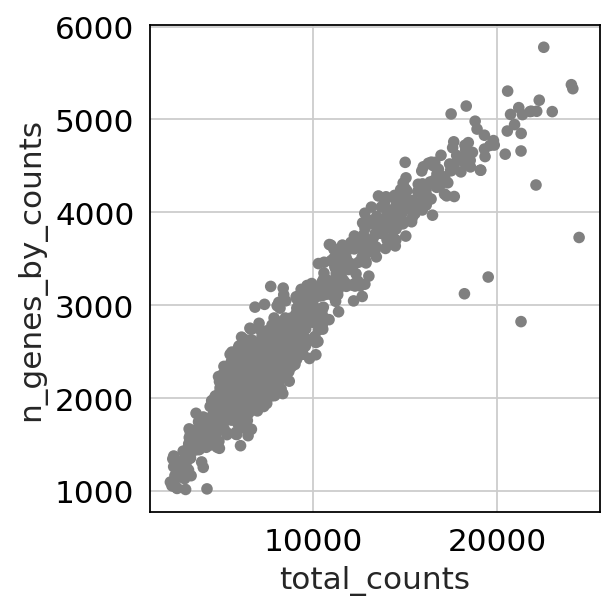

In [277]:
sc.pl.scatter(adata_filtered, x='total_counts', y='pct_counts_mito')
sc.pl.scatter(adata_filtered, x='total_counts', y='n_genes_by_counts')

Potential things to look for in the type of QA plot produced above, generally a linear relationship is expected with a higher number of UMIs linked to a higher number of genes
1. Data points in the bottom LEFT hand quadrant = low genes and UMIs per cell. May represent poor quality cells.
2. Data points in the bottom RIGHT hand quadrant = low genes but high UMIs per cell. These could be dying cells, **but** also could represent a population of a low complexity celltype that express a low number of genes (i.e red blood cells).

In [278]:
print('median gene counts per cell: ' + str(adata_filtered.obs['total_counts'].median()))

median gene counts per cell: 7604.0


In [279]:
adata_filtered

AnnData object with n_obs × n_vars = 1104 × 29605
    obs: 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ambient', 'arcsinh_total_counts', 'arcsinh_n_genes_by_counts', 'dropkick_score', 'dropkick_label', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'total_counts', 'mean', 'std', 'dropkick_coef', 'mt'
    uns: 'dropkick_thresholds', 'dropkick_args'
    layers: 'raw_counts', 'arcsinh_norm'

### Visualization

#### Scaling and normalization

tSNE and UMAP are commly used in scRNA-Seq, with UMAP being currently the standard/best practice. It is standard practice to apply a linear transformation ('scaling') before PCA. For single cell data this includes:
1. Shifting the expression of each gene, so that the mean expression across cells is 0
2. Scaling the expression of each gene, so that the variance across cells is 1.
This gives equal weight in downstream analyses, so that highly-expressed genes do not dominate

For simplicity, **dropkick** has a "recipe" function that will perform preprocessing and normalization for us to prepare for dimension reduction, clustering, and embedding.

In [280]:
# here, we want to end up working with normalized, log1p-transformed counts 
#   where genes are scaled to unit variance and zero-centered
# we also set filter=True to remove any genes with zero total counts
# we perform a variable gene selection for 2000 HVGs before further processing
adata_filtered = dk.recipe_dropkick(adata_filtered, calc_metrics=False, X_final="log1p_norm", filter=False, n_hvgs=2000, verbose=True)

normalizing counts per cell
    finished (0:00:00)
Determining 2000 highly variable genes
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
Setting log1p_norm layer to .X


Next we can run **PCA** as an initial dimension reduction, followed by **UMAP** to embed the cells in a 2-dimensional space.

In [281]:
adata_filtered

AnnData object with n_obs × n_vars = 1104 × 29605
    obs: 'n_genes_by_counts', 'total_counts', 'pct_counts_mito', 'pct_counts_ambient', 'arcsinh_total_counts', 'arcsinh_n_genes_by_counts', 'dropkick_score', 'dropkick_label', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mito', 'pct_dropout_by_counts', 'ambient', 'n_cells_by_counts', 'mean_counts', 'total_counts', 'mean', 'std', 'dropkick_coef', 'mt', 'highly_variable', 'means'
    uns: 'dropkick_thresholds', 'dropkick_args', 'log1p', 'hvg'
    layers: 'raw_counts', 'arcsinh_norm', 'log1p_norm'

#### PCA

Here PCA shouldn't be applied as there are many more samples, i.e., each single cell is one sample, compared to bulk RNA-Seq where 10-20 samples are analyzed. 

computing PCA
    on highly variable genes
    with n_comps=40
    finished (0:00:00)


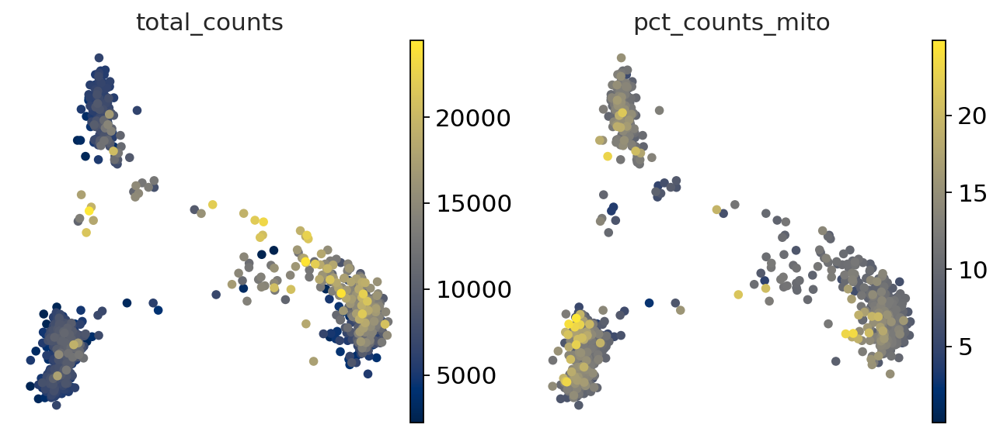

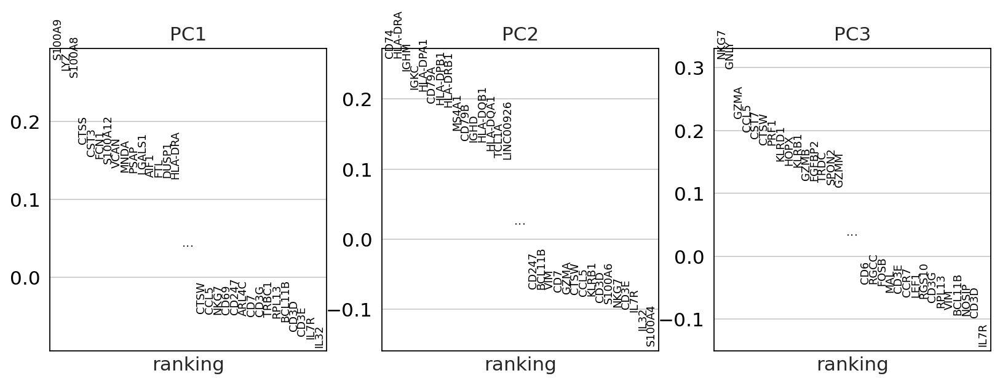

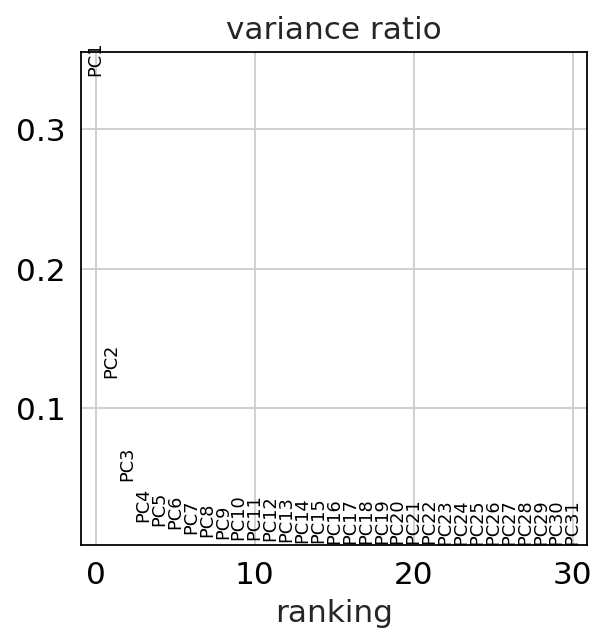

In [308]:
sc.set_figure_params(color_map="cividis", frameon=False) # other percpetually uniform cmap are viridis, plasma, magma and inferno

sc.tl.pca(adata_filtered, n_comps=40, use_highly_variable=True)
sc.pl.pca_overview(adata_filtered, color=["total_counts", "pct_counts_mito"])

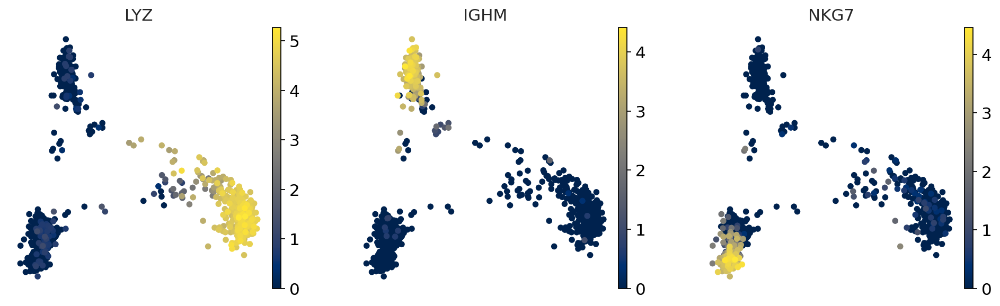

In [309]:
# rc_context is used for the figure size, in this case 4x4
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.pca(adata_filtered, color=["LYZ", "IGHM", "NKG7"], frameon=False)

#### UMAP

In [288]:
sc.pp.neighbors(adata_filtered, n_neighbors=40, random_state=1, n_pcs=10)
sc.tl.leiden(adata_filtered, resolution=.4)
sc.tl.umap(adata_filtered, random_state=1)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


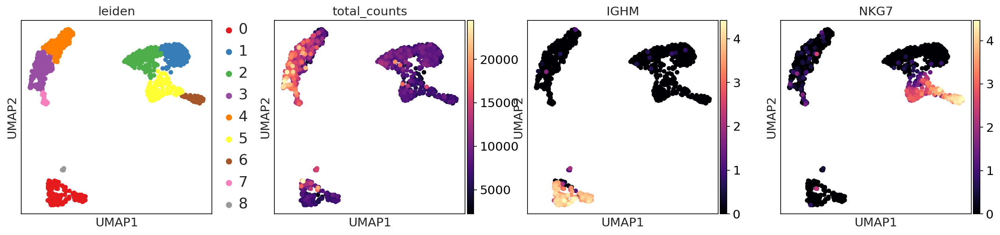

In [314]:
sc.set_figure_params(color_map="magma", frameon=True)

sc.pl.umap(
    adata_filtered,
    color=[
        "leiden",
        "total_counts",
        "IGHM",
        "NKG7"
    ],
    legend_fontsize="large",
)

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


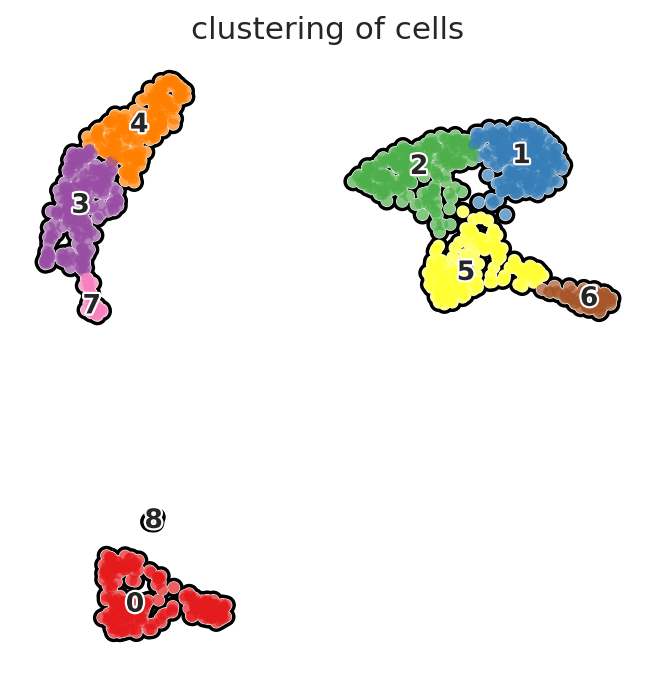

In [313]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(
        adata_filtered,
        color='leiden',
        add_outline=True,
        legend_loc='on data',
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title='clustering of cells',
        palette='Set1',
    )

## Heuristic analysis

Without a method such as dropkick or emptyDrops, we define manual thresholds on global heuristics such as total counts of unique molecular identifiers (UMI) or the total number of genes detected in each barcode in order to isolate high-quality cells. While these hard cutoffs may generally yield expected cell populations and remove the bulk of populational noise in low-background samples, they are highly arbitrary, batch-specific, and generally biased against cell types with low RNA content or genetic diversity. Furthermore, lenient thresholds often yield filtered datasets with populations of dead and dying cells or empty droplets with high ambient RNA content, especially in encapsulations with high background resulting from tissue-specific cell viability and dissociation protocols. These cell clusters may be gated out manually by the experienced single-cell biologist, but they will distort dimension-reduced embeddings and alter statistical testing for differential gene expression if left unchecked (Heiser, Cody N., Victoria M. Wang, Bob Chen, Jacob J. Hughey, and Ken S. Lau. "Automated Quality Control and Cell Identification of Droplet-Based Single-Cell Data Using Dropkick." Genome Research 31, no. 10 (October 1, 2021): 1742–52. https://doi.org/10.1101/gr.271908.120)

It is therefore useful to examine mitochondrial genes, which are important for quality control. [(Lun, McCarthy & Marioni, 2017)](https://master.bioconductor.org/packages/release/workflows/html/simpleSingleCell.html#examining-gene-level-metrics) write that

> High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

Note you can also use the function `pp.calculate_qc_metrics` to compute the fraction of mitochondrial genes and additional measures.

Show those genes that yield the highest fraction of counts in each single cells, across all cells.

In [497]:
# we reload the raw counts

adata = sc.read_10x_mtx(
    './output/counts_unfiltered/cellranger', # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

# adata.var_names_make_unique() # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

... reading from cache file cache/output-counts_unfiltered-cellranger-matrix.h5ad


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/anndata/utils.py:111: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


normalizing counts per cell
    finished (0:00:00)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


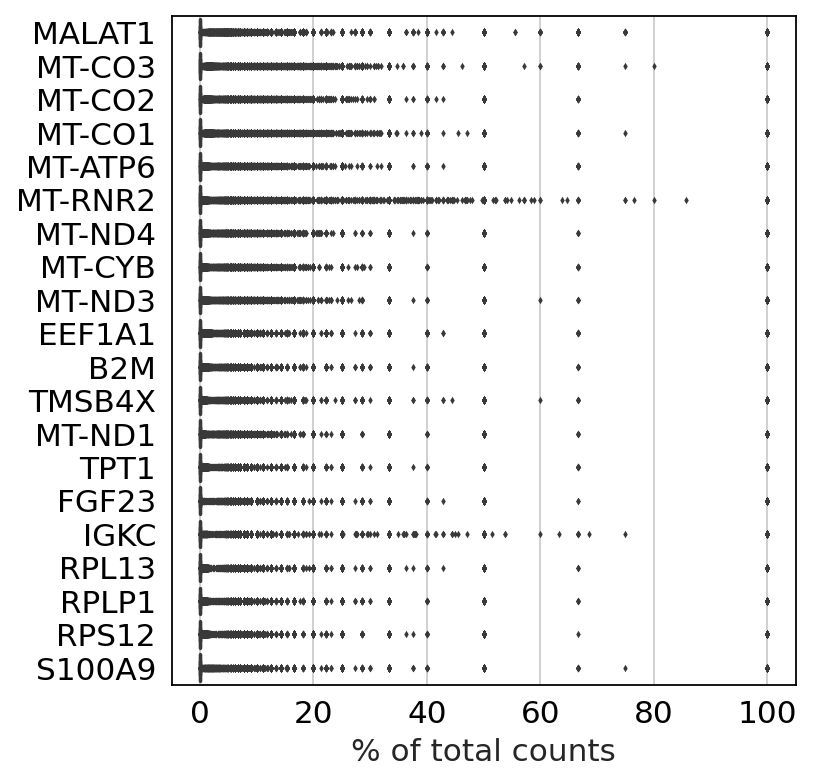

In [498]:
# show those genes that yield the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata, n_top=20)

### Basic filtering

After reading in the data we'll perform basic filtering a on our expression matrix to remove low quality cells and uninformative genes. The parameter "min_genes" will keep cells that have at least 200 genes, and similarly, "min_cells" will keep genes that are expressed in at least 3 cells.

In [499]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_counts=3)

filtered out 249396 cells that have less than 200 genes expressed
filtered out 36593 genes that are detected in less than 3 counts


In this step we'll perform cell quality control to prevent outlier cells from influencing downstream analyses. Cells that have unusually high transcript or gene counts are very likely to be multiplets, which is a term for two or more cells that have identical barcodes. Conversely, cells that have very low transcript or genes counts are a consequence of barcoding cells with damage membranes, or barcoding ambient RNA.

Filtering outliers can be accomplished by generating a violin plot for each cell feature and manually (or using quantile) selecting the threshold we wish to remove cells. We'll also add another important cell feature that shows the percentage of mitochondrial genes expressed in each cell. Cells with high mitochondrial gene percentages should be removed, as they are likely to have lost cytoplasmic RNA from lysis or may have increased apoptosis (Luecken and Theis 2019).

### Mitochondrial genes

Let's assemble some information about mitochondrial genes, which are important for quality control.

Citing from "Simple Single Cell" workflows [(Lun, McCarthy & Marioni, 2017)](https://master.bioconductor.org/packages/release/workflows/html/simpleSingleCell.html#examining-gene-level-metrics):

> High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

With `pp.calculate_qc_metrics`, we can compute many metrics very efficiently, including variables we want to control for, e.g., `pc_counts_mt`.

In [500]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Another option would be to compute the pct_mt manually:

```python
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = 100*np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
```

### QC check of the counts post-filtering

A violin plot of some of the computed quality measures:

* the number of genes expressed in the count matrix
* the total counts per cell
* the percentage of counts in mitochondrial genes

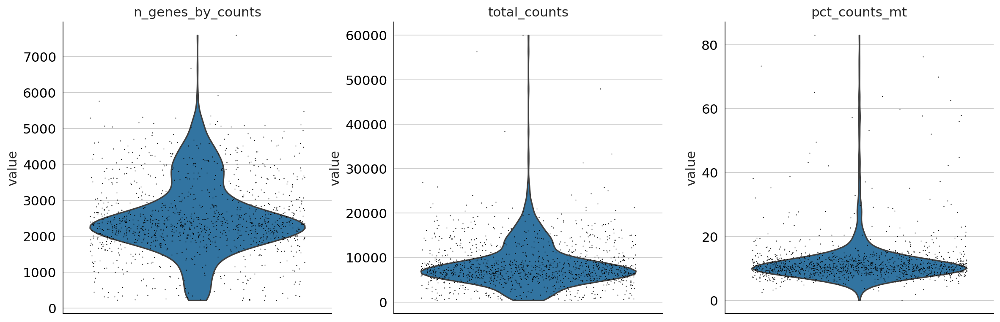

In [501]:
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True,
)

Remove cells that have too many mitochondrial genes expressed or too many total counts

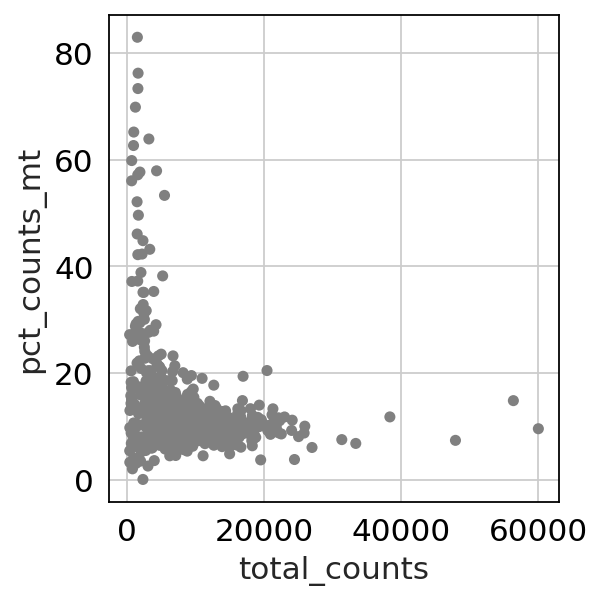

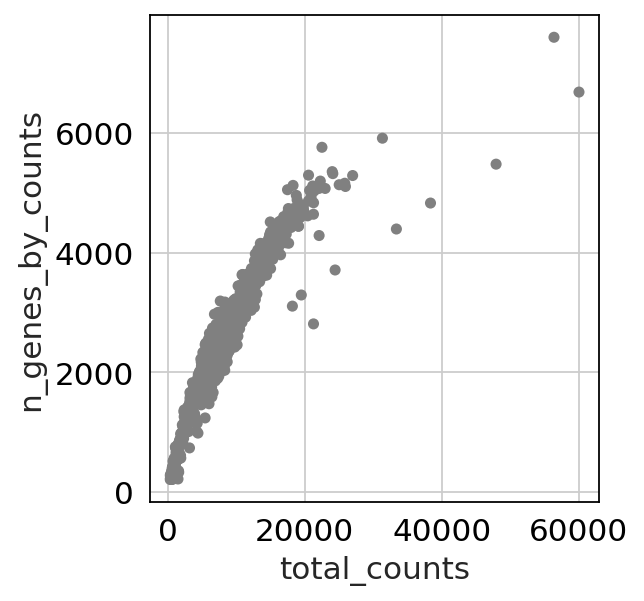

In [502]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

### Filtering the data

Actually do the filtering by slicing the `AnnData` object.

We could breate a mask:

```python
mask = np.logical_or((adata.obs.n_genes < 6500).values, (adata.obs.n_genes > 200).values, (adata.obs.percent_mito < 0.2).values)
adata = adata[mask, :]
```


In [503]:
adata = adata[adata.obs.n_genes_by_counts > 1000, :]
adata = adata[adata.obs.total_counts > 1000, :]
adata = adata[adata.obs.total_counts < 25000, :]
adata = adata[adata.obs.pct_counts_mt < 25, :]

In [504]:
adata

View of AnnData object with n_obs × n_vars = 1104 × 24030
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

Lets visualize the results of our filtered data and print the updated median transcript and gene counts.

In [505]:
print('median gene counts per cell: ' + str(adata.obs['total_counts'].median(0)))

median gene counts per cell: 7595.0


### Normalize counts

Now that we've removed the outlier cells, we can normalize the matrix to 10,000 reads per cell and log transform the results. Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.

In [506]:
# normalize counts in each cell to be equal
sc.pp.normalize_total(adata, target_sum=10**4)

normalizing counts per cell
    finished (0:00:00)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize (1+n) the data

In [507]:
# Replace raw counts with their logarithm
sc.pp.log1p(adata)

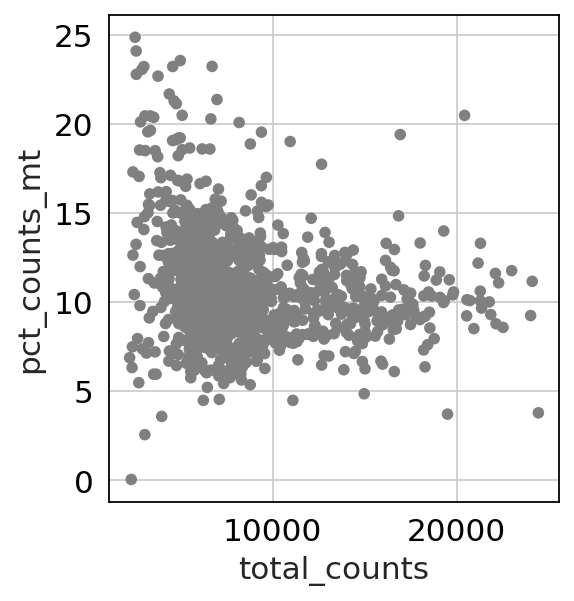

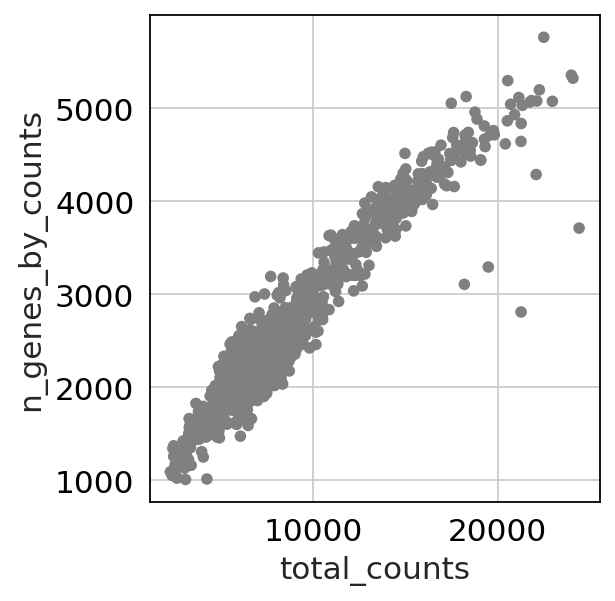

In [508]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

### Identify highly-variable genes and regress out transcript counts

Our next goal is to identify genes with the greatest amount of variance (i.e. genes that are likely to be the most informative). This subset of genes will be used to calculate a set of principal components which will determine how our cells are classified using Leiden clustering and UMAP. You can fine tune variable gene selection by adjusting the min/max mean expression and min/max dispersion.

The regress out function is used to correct for biases in cell attributes, such as the number transcripts per cell. It's important to note that this step can merge cell populations with subtle differences in gene expression, which may or may not align with your analysis goals. You can always start a separate analysis without this feature to see which model suits your objectives.

In [509]:
# flavor="cell_ranger" is consistent with Seurat and flavor="suerat" is not consistent with Seurat
sc.pp.highly_variable_genes(adata, min_mean=0.01, max_mean=8, min_disp=1, n_top_genes=2000, flavor="cell_ranger", n_bins=20)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)


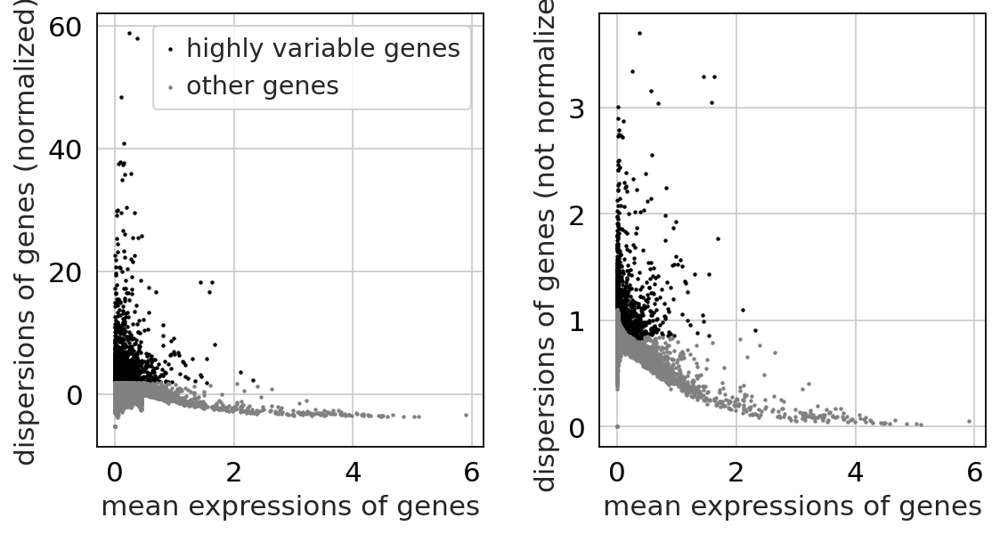

In [510]:
sc.pl.highly_variable_genes(adata)

Set the `.raw` attribute of AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

The unnormalized data is stored in `.raw`.

**Note**: You can get back an `AnnData` of the object in `.raw` by calling `.raw.to_adata()`.

In [511]:
# Save raw expression values before variable gene subset
adata.raw = adata

In [150]:
dir(adata)

['T',
 'X',
 '_BACKED_ATTRS',
 '_H5_ALIASES',
 '_H5_ALIASES_NAMES',
 '_X',
 '__class__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_adata_ref',
 '_check_dimensions',
 '_check_uniqueness',
 '_clean_up_old_format',
 '_gen_repr',
 '_get_X',
 '_get_and_delete_multicol_field',
 '_get_obs_array',
 '_get_var_array',
 '_has_X',
 '_init_as_actual',
 '_init_as_view',
 '_inplace_subset_obs',
 '_inplace_subset_var',
 '_is_view',
 '_layers',
 '_mutated_copy',
 '_n_obs',
 '_n_vars',
 '_normalize_indices',
 '_obs',
 '_obsm',
 '_obsp',
 '_oidx',
 '_prep_dim_index',
 '_raw',
 '_remove_unused_categories',
 '_sanitize'

We do not regress out as per https://github.com/theislab/scanpy/issues/526

>MT gene expression and cell cycle are both biological, rather than technical covariates. Regressing out biological covariates is generally done to isolate particular processes in the data that you are interested in, while losing global structure in the data. This is helpful especially for trajectory inference, but maybe less so for global exploratory analysis with clustering.

In [31]:
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

If you don't proceed below with correcting the data with `sc.pp.regress_out` and scaling it via `sc.pp.scale`, you can also get away without using `.raw` at all.

The result of the previous highly-variable-genes detection is stored as an annotation in `.var.highly_variable` and auto-detected by PCA and hence, `sc.pp.neighbors` and subsequent manifold/graph tools. In that case, the step *actually do the filtering* below is unnecessary, too.

### Scaling the data

Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

In [512]:
sc.pp.scale(adata, max_value=10) # z-normalization to avoid bias towards strongly expressed genes

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### Principal component analysis

Now that we've extracted the most "informative" cells and genes from our dataset, we can start the process of dimensional reduction by generating a list of principal components (PCs). Principal component analysis will reduce the number of columns (variable gene expression values) to set of PCs which explain the variance in our dataset. Here we're using a simple and effective method for choosing the PCs by plotting the variance ratio for each PC and choosing the last PC where the ratio starts to "flatten" out. For this particular dataset we've chosen 30 PCs, which will be passed to the "sc.pp.neighbors" function in the next step.

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [513]:
# We perform PCA on just the highly variable genes
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


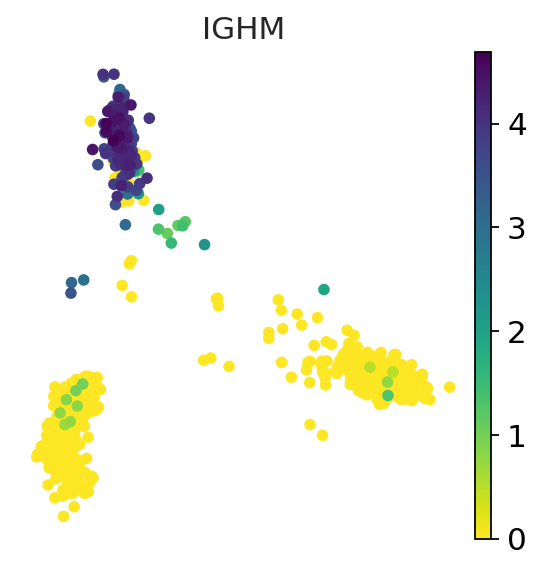

In [514]:
sc.pl.pca(adata, color='IGHM', frameon=False)

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.leiden()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

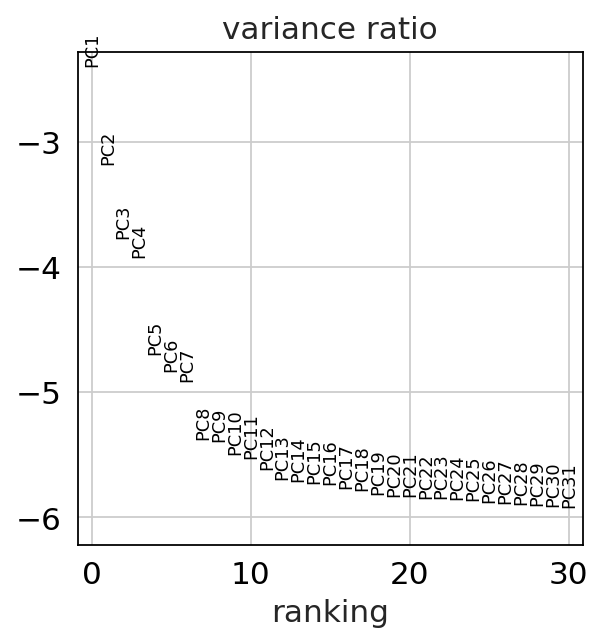

In [515]:
sc.pl.pca_variance_ratio(adata, log=True)

In [516]:
# save the results
adata.write(results_file)

### UMAP and Clustering

This step will involve reducing the dimensionality of our data into two dimensions using uniform manifold approximation (UMAP), allowing us to visualize our cell populations as they are binned into discrete populations using Leiden clustering. The "n_neighbors" parameter in the "sc.pp.neighbors" function will determine the size of each cell cluster; lower values will translate to a greater number of clusters by breaking up the dataset into smaller communities, and visa versa for larger values. We can also fine tune the number of clusters using the resolution parameter in the "sc.tl.leiden" function.

#### Computing the neighborhood graph

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values.

In [517]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:00)


#### Embedding the neighborhood graph

We suggest embedding the graph in two dimensions using UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

```Python
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')
```

In [518]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:01)


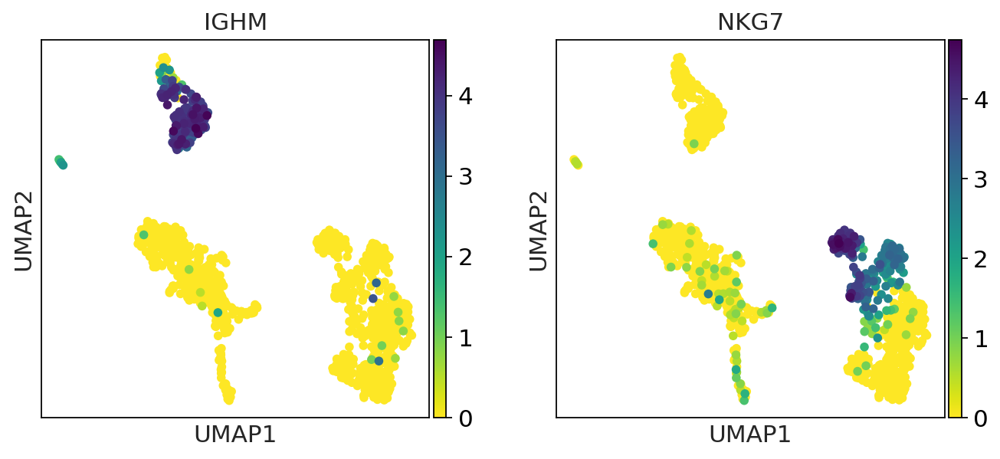

In [519]:
sc.pl.umap(adata, color=['IGHM', 'NKG7'])

As we set the `.raw` attribute of `adata`, the previous plots showed the "raw" (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use `.raw`.

Multiple values can be given to `color`, e.g., we can plot 6 genes: 'CD79A', 'MS4A1', 'IGJ', CD3D', 'FCER1A', and 'FCGR3A' to get an idea on where those marker genes are being expressed. Also, we will plot two other values: `n_counts` which is the number of UMI counts per cell (stored in `.obs`), and other categorical value containing the original labelling of the cells from 10X. 

The number of plots per row is controlled using the `ncols` parameter. The maximum value plotted can be adjusted using `vmax` (similarly `vmin` can be used for the minimum value). In this case we use `p99`, which means to use as max value the 99 percentile. The max value can be a number or a list of numbers if the vmax wants to be set for multiple plots individually.

Also, we are using `frameon=False` to remove the boxes around the plots and `s=50` to set the dot size.

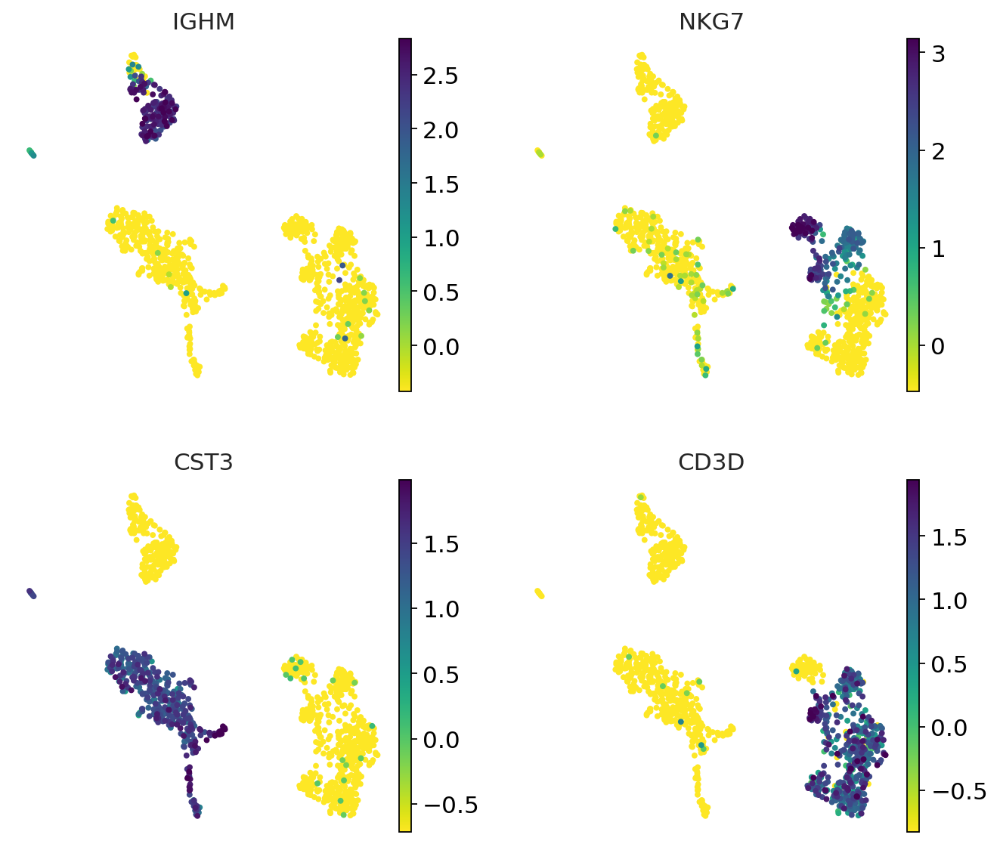

In [520]:
sc.set_figure_params(dpi=80, color_map = 'viridis_r')
sc.pl.umap(adata, color=['IGHM', 'NKG7', 'CST3', 'CD3D'], use_raw=False, frameon=False, s=50, vmax='p99', ncols=2)

#### Clustering the neighborhood graph

There are many algorithms for clustering cells, and while they have been compared in detail in various benchmarks (see e.g., [Duo et al. 2018](https://f1000research.com/articles/7-1141/v2)), there is no univerally agreed upon method. Here we demonstrate clustering using [Louvain clustering](https://en.wikipedia.org/wiki/Louvain_modularity), which is a popular method for clustering single-cell RNA-seq data. The method was published in 

- Blondel, Vincent D; Guillaume, Jean-Loup; Lambiotte, Renaud; Lefebvre, Etienne (9 October 2008). "Fast unfolding of communities in large networks". Journal of Statistical Mechanics: Theory and Experiment. 2008 (10): P10008.

Note that Louvain clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by [Traag *et al.* (2018)](https://scanpy.readthedocs.io/en/latest/references.html#traag18). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [521]:
sc.tl.leiden(adata, resolution=0.4,)

running Leiden clustering
    finished (0:00:00)


In [522]:
sc.tl.louvain(adata, resolution=0.4, random_state=42)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


A plot of the clusters is shown below:

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


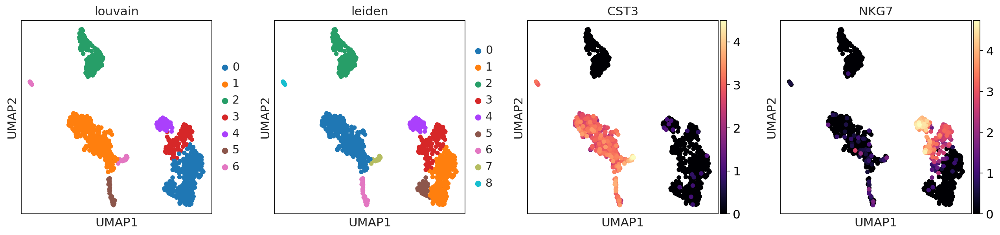

In [523]:
sc.set_figure_params(dpi=80, color_map = 'magma')
sc.pl.umap(adata, color=['louvain', 'leiden', 'CST3', 'NKG7'])

In [524]:
# save the results
adata.write(results_file)

#### Find marker genes

A key aspect of annotating a cell atlas is identifying "marker genes". These are genes specific to individual clusters that "mark" them, and are important both for assigning functions to cell clusters, and for designing downstream experiments to probe activity of clusters. 

A gene marker analysis begins with ranking genes in each cluster according to how different they are relative to other clusters. Typically the t-test is used for this purpose.

After determining the appropriate number clusters, we'll perform a statistical test to find genes enriched in each cell population. For this example we'll use the simplest and quickest method, the t-test. Scanpy provides a number of different statistical tests which can be found here.

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

ranking genes
    finished (0:00:00)


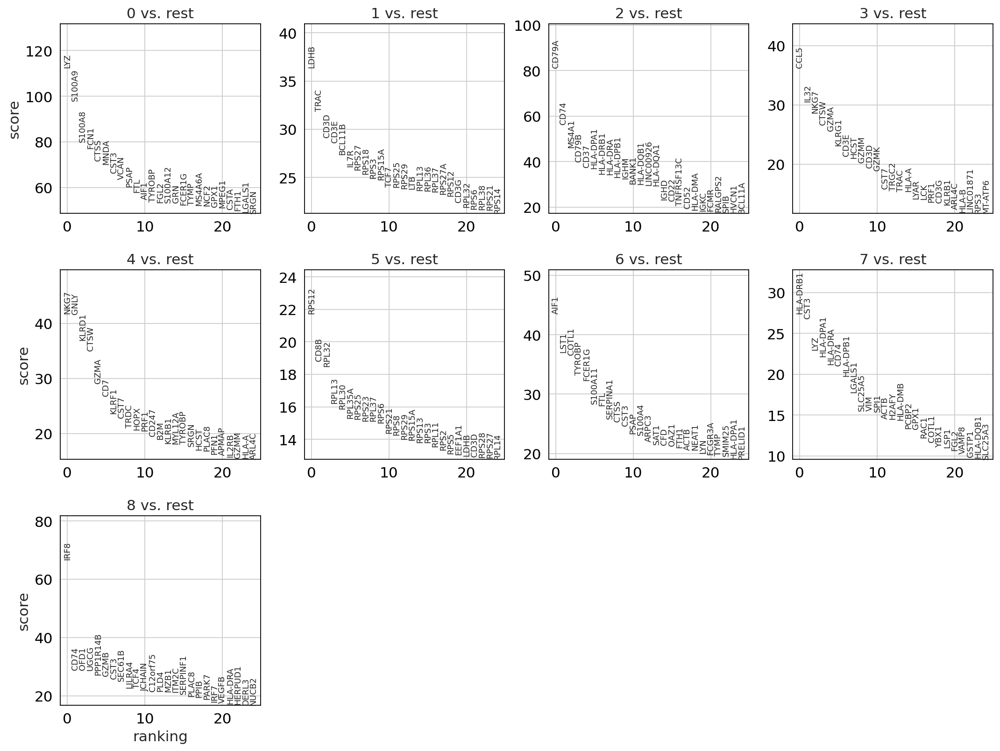

In [525]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test', corr_method="bonferroni")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

The result of a [Wilcoxon rank-sum (Mann-Whitney-U)](https://en.wikipedia.org/wiki/Mann%E2%80%93Whitney_U_test) test is very similar. We recommend using the latter in publications, see e.g., [Sonison & Robinson (2018)](https://doi.org/10.1038/nmeth.4612). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished (0:00:02)


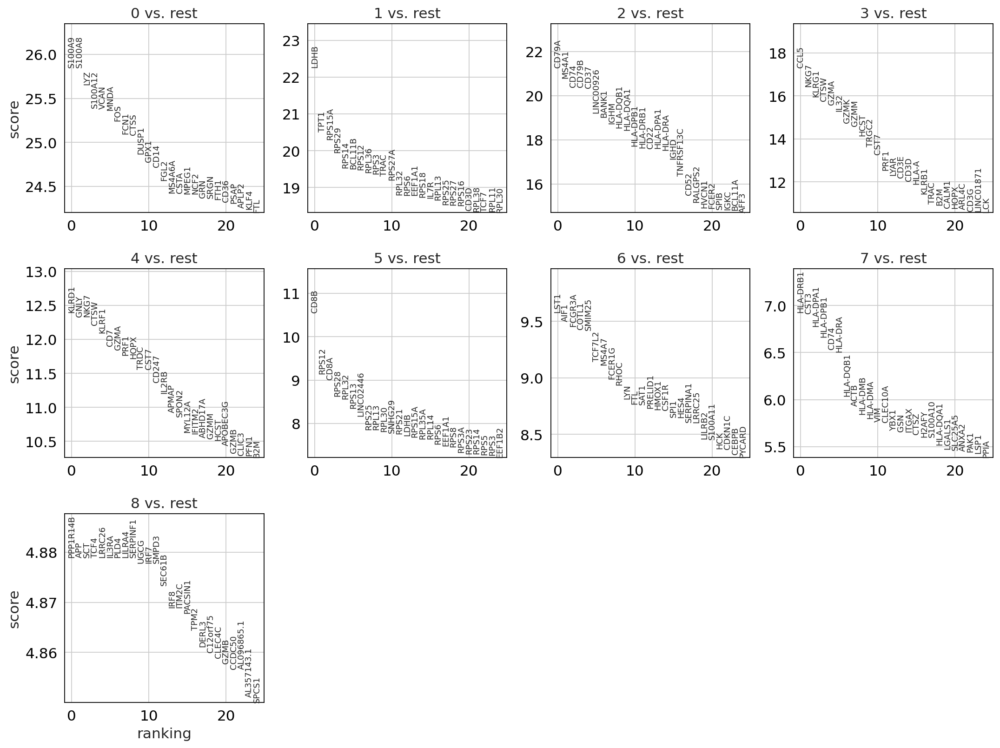

In [526]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', corr_method="bonferroni")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [527]:
# save the results
adata.write(results_file)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by [Natranos et al. (2018)](https://doi.org/10.1101/258566). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. [Clark et al. (2014)](https://doi.org/10.1186/1471-2105-15-79) has more details.

ranking genes
    finished (0:00:13)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


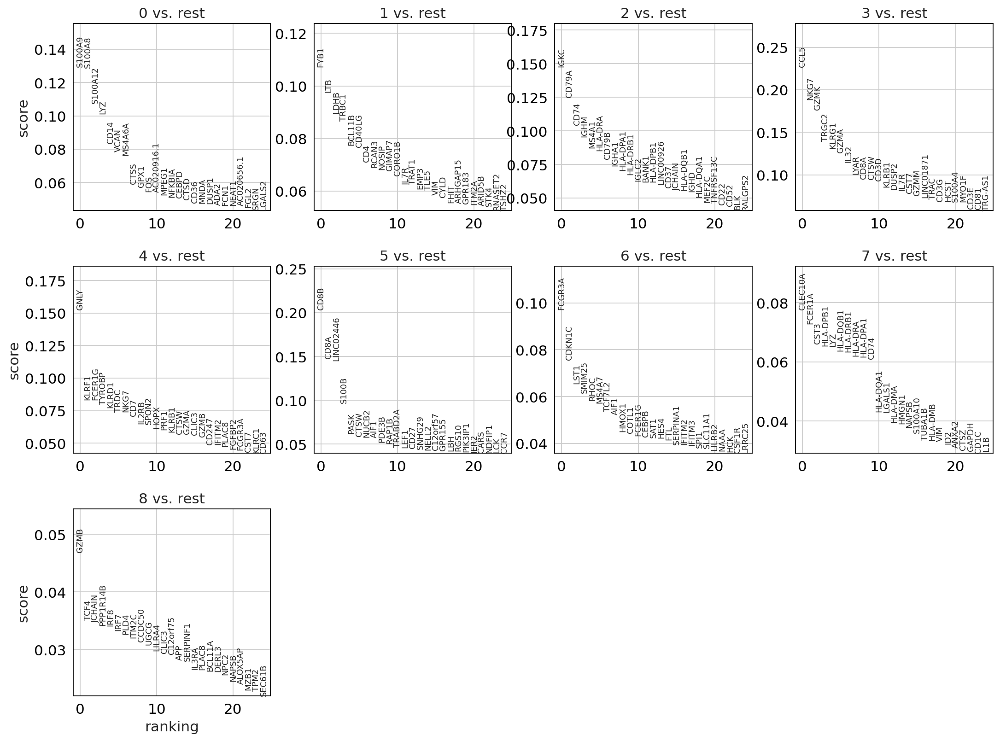

In [528]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [599]:
markers = sc.get.rank_genes_groups_df(adata, None)

In [600]:
markers.sample(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj
185883,7,CA3-AS1,-0.065161,-22.809875,0.948046,0.999077
39075,1,ZBTB21,-0.254158,0.083322,0.799374,0.999820
164643,6,RASSF6,-0.207055,-24.069643,0.835967,1.000000
212107,8,AC018647.3,-0.191420,-24.695126,0.848196,0.998110
114844,4,AC127520.1,-0.344562,-0.891572,0.730424,1.000000
171943,7,EPRS,1.011532,0.403806,0.311762,0.999077
115633,4,RRN3,-0.431025,-0.253422,0.666450,1.000000
21570,0,SYT5,-0.933549,-3.526270,0.350537,1.000000
81323,3,IQCG,-0.025768,0.344309,0.979442,1.000000
20317,0,MGAT4C,-0.533799,-2.555477,0.593480,1.000000


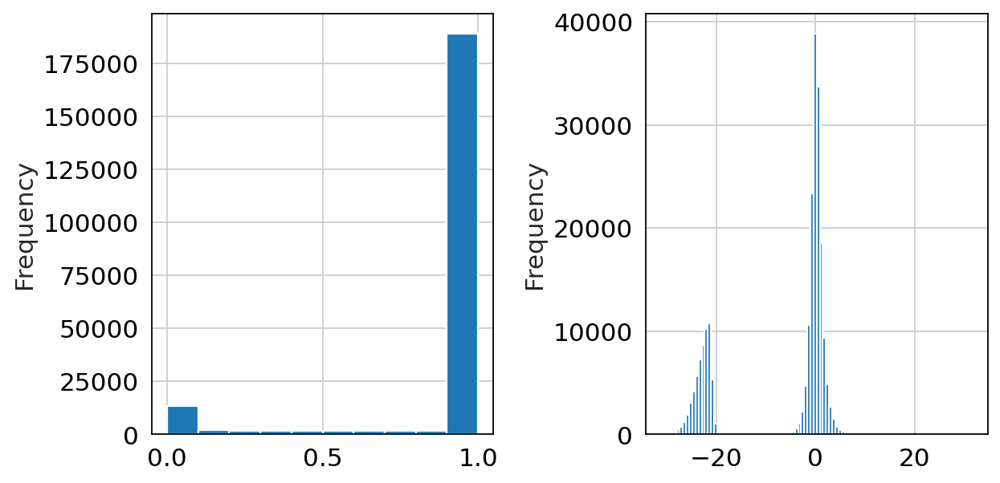

In [613]:
plt.figure(figsize=(8,4))
plt.subplot(121)
markers['pvals_adj'].plot.hist(bins=10)
plt.subplot(122)
markers['logfoldchanges'].plot.hist(bins=100)
plt.tight_layout();

In [529]:
#Show the 10 top ranked genes per cluster 0, 1, ..., 8 in a dataframe.
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)
print(top_markers)

         0       1         2      3       4          5       6         7  \
0   S100A9    FYB1      IGKC   CCL5    GNLY       CD8B  FCGR3A   CLEC10A   
1   S100A8     LTB     CD79A   NKG7   KLRF1       CD8A  CDKN1C    FCER1A   
2  S100A12    LDHB      CD74   GZMK  FCER1G  LINC02446    LST1      CST3   
3      LYZ   TRBC1      IGHM  TRGC2  TYROBP      S100B  SMIM25  HLA-DPB1   
4     CD14  BCL11B     MS4A1  KLRG1   KLRD1       PASK    RHOC       LYZ   
5     VCAN  CD40LG   HLA-DRA   GZMA    TRDC       CTSW   MS4A7  HLA-DQB1   
6   MS4A6A     CD4     CD79B   IL32    NKG7      NUCB2  TCF7L2  HLA-DRB1   
7     CTSS   RCAN3     IGHA1   LYAR     CD7       AIF1    AIF1   HLA-DRA   
8     GPX1   NOSIP  HLA-DPA1   CD8A   IL2RB      PDE3B   HMOX1  HLA-DPA1   
9      FOS  GIMAP7  HLA-DRB1   CTSW   SPON2      RAP1B   COTL1      CD74   

          8  
0      GZMB  
1      TCF4  
2    JCHAIN  
3  PPP1R14B  
4      IRF8  
5      IRF7  
6      PLD4  
7     ITM2C  
8    CCDC50  
9      UGCG  


In [531]:
# reload the object that has been save with the Wilcoxon Rank-Sum test result.
adata = sc.read(results_file)

In [532]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p,7_n,7_p,8_n,8_p
0,S100A9,2.312320e-147,LDHB,8.385374e-110,CD79A,1.877939e-100,CCL5,3.233013e-67,KLRD1,2.686689e-35,CD8B,4.626237e-26,LST1,9.737250e-22,HLA-DRB1,4.263180e-12,PPP1R14B,0.000001
1,S100A8,2.414431e-147,TPT1,1.278194e-93,MS4A1,4.850262e-96,NKG7,1.019321e-60,GNLY,5.777438e-35,RPS12,6.272494e-20,AIF1,2.081216e-21,CST3,4.574034e-12,APP,0.000001
2,LYZ,3.580236e-145,RPS15A,1.261963e-91,CD74,1.739279e-92,KLRG1,2.420035e-57,NKG7,5.965562e-35,CD8A,1.971909e-19,FCGR3A,3.169211e-21,HLA-DPA1,1.219214e-11,SCT,0.000001
3,S100A12,3.309560e-142,RPS29,1.334358e-88,CD79B,1.827579e-92,CTSW,5.805173e-56,CTSW,2.641631e-34,RPS28,5.919807e-18,COTL1,4.079437e-21,HLA-DPB1,2.656418e-11,TCF4,0.000001
4,VCAN,4.059417e-142,RPS14,5.663275e-85,CD37,5.057101e-92,GZMA,9.230062e-55,KLRF1,1.077108e-33,RPL32,1.027790e-17,SMIM25,4.397477e-21,CD74,6.365065e-11,LRRC26,0.000001


With the exceptions of *IL7R*, which is only found by the t-test in cluster '1', all marker genes are recovered in all approaches. Note that the platelet marker *PPBP* isn't present in this dataset. We also have a couple unclassified clusters that aren't present in the official tutorial.

Louvain Group | Markers | Cell Type
---|---|---
0 | IL7R, CCR7 | Naive CD4 T cells
1 | CD14, LYZ | CD14+ Monocytes
2 | MS4A1 |	B cells
3 | CD8A |	CD8 T cells
4 | GNLY, NKG7 | 	NK cells
5 | FCGR3A, MS4A7 |	FCGR3A+ Monocytes
6 | FCER1A, CST3 |	Dendritic Cells
7 | PPBP |	Megakaryocytes/Platelets

Let us also define a list of marker genes for later reference.

In [533]:
marker_genes = [
    'IL7R', 'CCR7', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
    'GNLY', 'NKG7', 'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP',
]

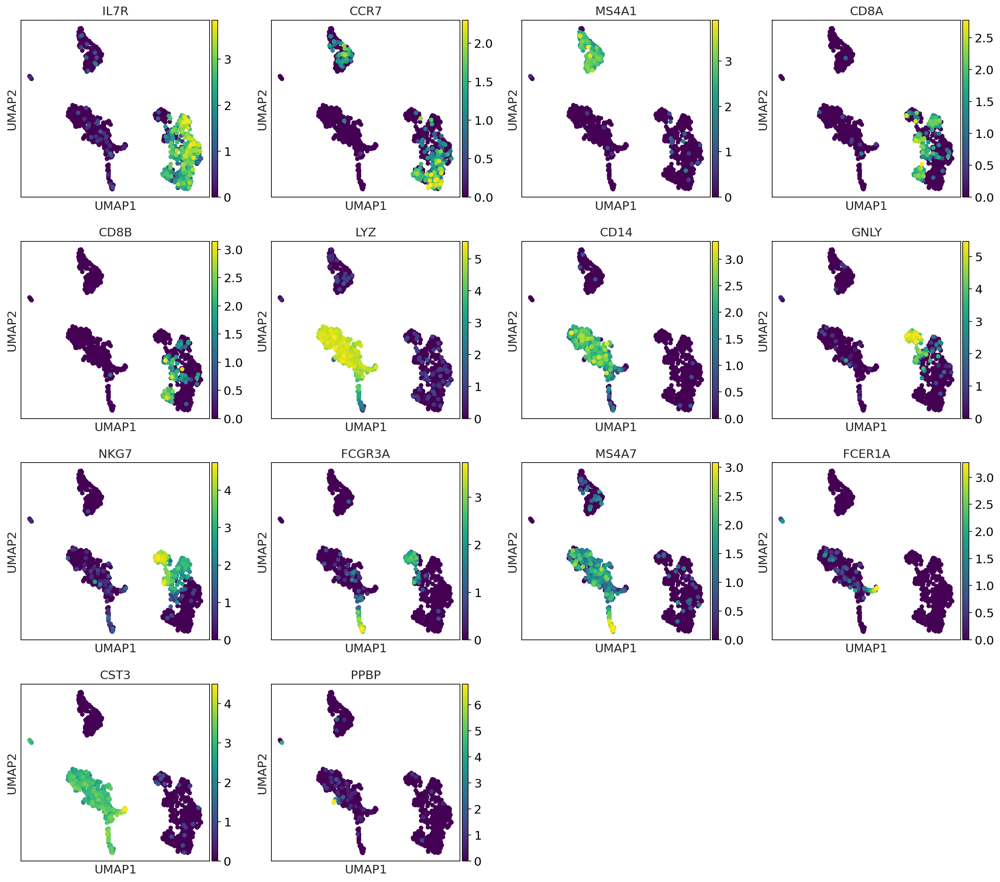

In [534]:
sc.pl.umap(adata, color=[i for i in marker_genes], color_map='viridis', legend_fontsize=8)

Compare to a single cluster

ranking genes
    finished (0:00:00)


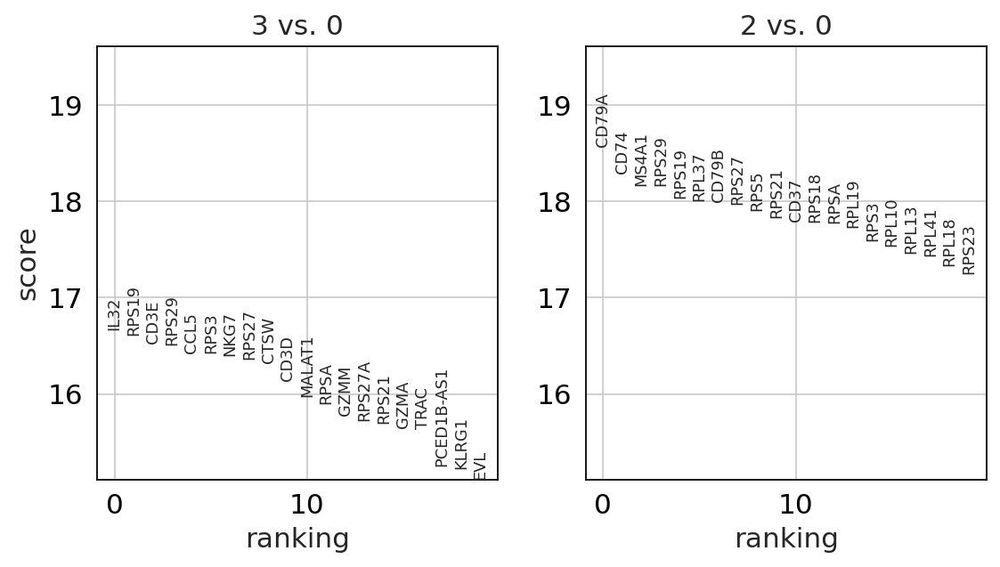

In [535]:
adata.uns['log1p']["base"] = None
# see the issue in scanpy==1.9.1 https://github.com/scverse/scanpy/pull/2283

sc.tl.rank_genes_groups(adata, 'leiden', groups=['3', '2'], reference='0', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['3', '2'], n_genes=20)

If we want a more detailed view for a certain group, use `sc.pl.rank_genes_groups_violin`.

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


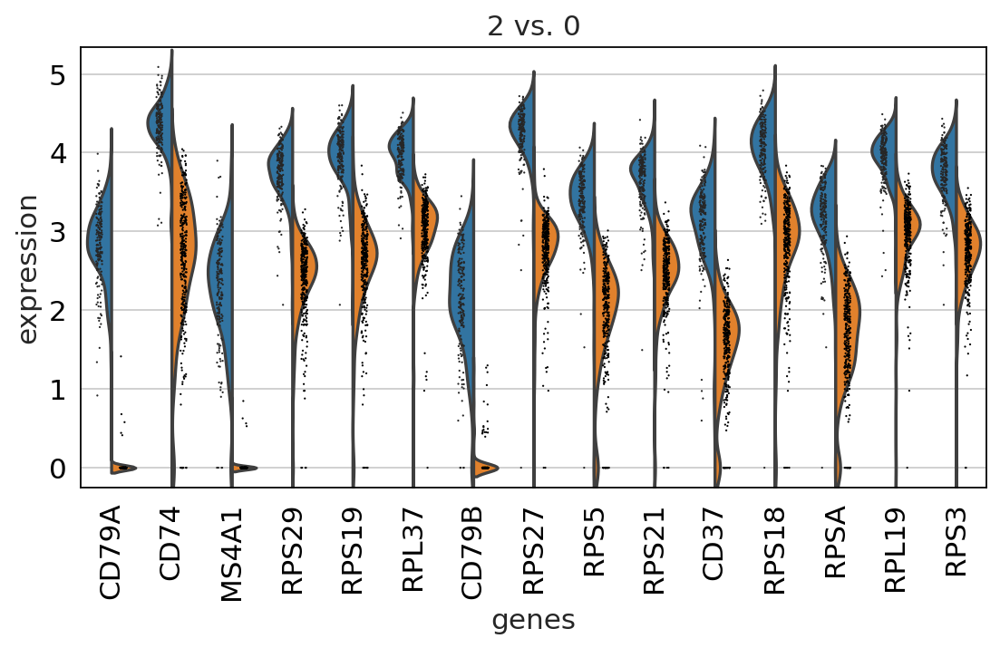

In [539]:
with rc_context({'figure.figsize': (8, 4)}):
    sc.pl.rank_genes_groups_violin(adata, groups='2', n_genes=15)

#### Violin plot

If you want to compare a certain gene across groups, use the following.

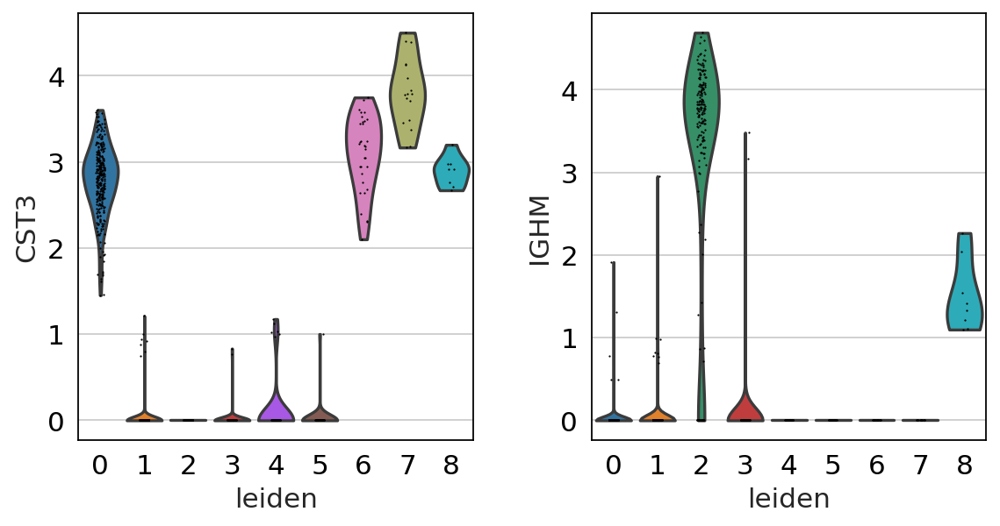

In [540]:
sc.pl.violin(adata, ['CST3', 'IGHM'], groupby='leiden')

**Note** Violin plots can also be used to plot any numerical value stored in `.obs`. For example, here violin plots are used to compare the number of genes and the percentage of mitochondrial genes between the different clusters. 

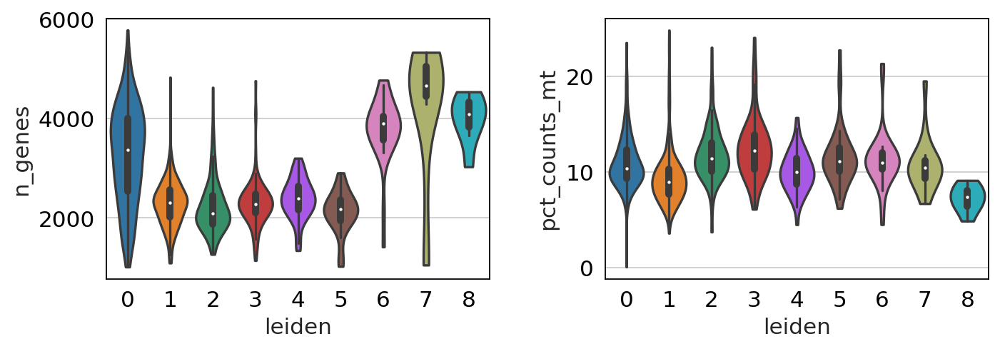

In [550]:
with rc_context({'figure.figsize': (4.5, 3)}):
    sc.pl.violin(
        adata, ['n_genes', 'pct_counts_mt'],
        groupby='leiden',
        stripplot=False, # use stripplot=False to remove the internal dots
        inner='box',     # inner='box' adds a boxplot inside violins
    ) 

### Identification of clusters based on known marker genes

Frequently, clusters need to be labelled using well known marker genes. Using scatter plots we can see the expression of a gene and perhaps associate it with a cluster. Here, we will show other visual ways to associate marker genes to clusters using *dotplots*, *violin plots*, *heatmaps* and something that we call '*tracksplot*'. All of these visualizations summarize the same information, expression split by cluster, and the selection of the best results is left to the investigator do decide.
 
First, we set up a dictionary with the [marker genes](http://biocc.hrbmu.edu.cn/CellMarker/), as this will allow scanpy to automatically label the groups of genes:

In [541]:
marker_genes_dict = {
    'B-cells': ["MS4A1", "IGHD"],
    'Monocytes': ["CD14", "FCGR3A"],
    'Dendritic': ['FCER1A', 'CST3'],
    'NK': ["GZMK", "NKG7"],
    'T-cells': ["CD4", "CD8A", "CD3E"],
}

#### Dotplot

A quick way to check the expression of these genes per cluster is to using a dotplot. This type of plot summarizes two types of information: the color represents the mean expression within each of the categories (in this case in each cluster) and the dot size indicates the fraction of cells in the categories expressing a gene. 

Also, it is also useful to add a dendrogram to the graph to bring together similar clusters. The hierarchical clustering is computed automatically using the correlation of the PCA components between the clusters.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


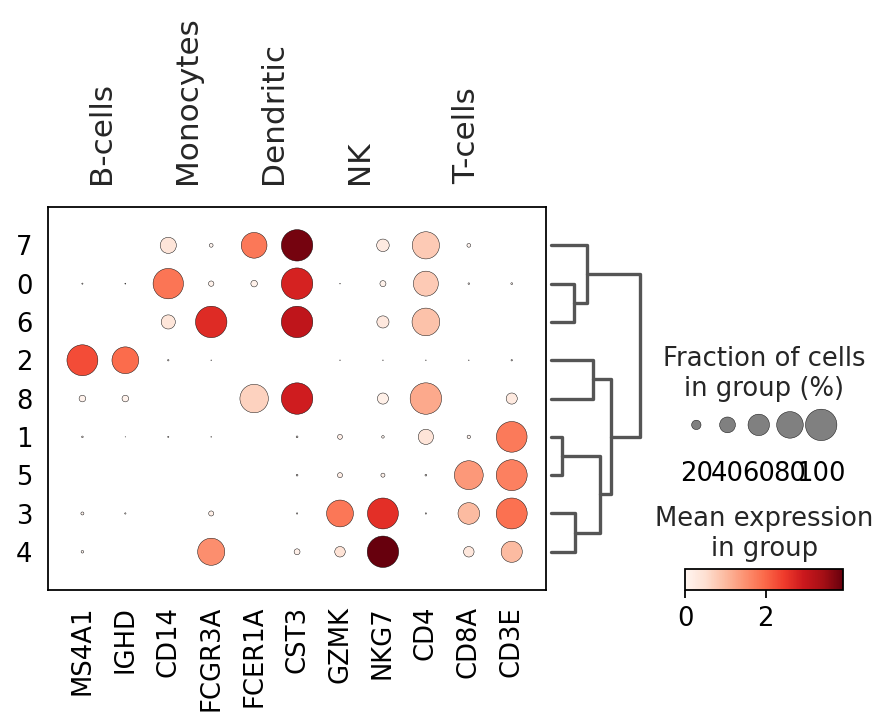

In [542]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', dendrogram=True)

Using this plot, we can see that cluster '2' correspond to B-cells, clusters '0' and '6' are monocytes, clusters '7' and '8' are dendritic cells, '1' is CD4 T-cells, '5' CD8+ T cells, and clusters '3' an,d '4' are NK cells. This information can be used to manually annotate the cells as follows:

In [543]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
     '0': 'Mono',
     '1': 'CD4',
     '2': 'B',
     '3': 'NK',
     '4': 'NK',
     '5': 'CD8',
     '6': 'Mono',
     '7': 'DC',
     '8': 'DC',
}

In [544]:
# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs['cell_type'] = adata.obs['leiden'].map(cluster2annotation).astype('category')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`
categories: B, CD4, CD8, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


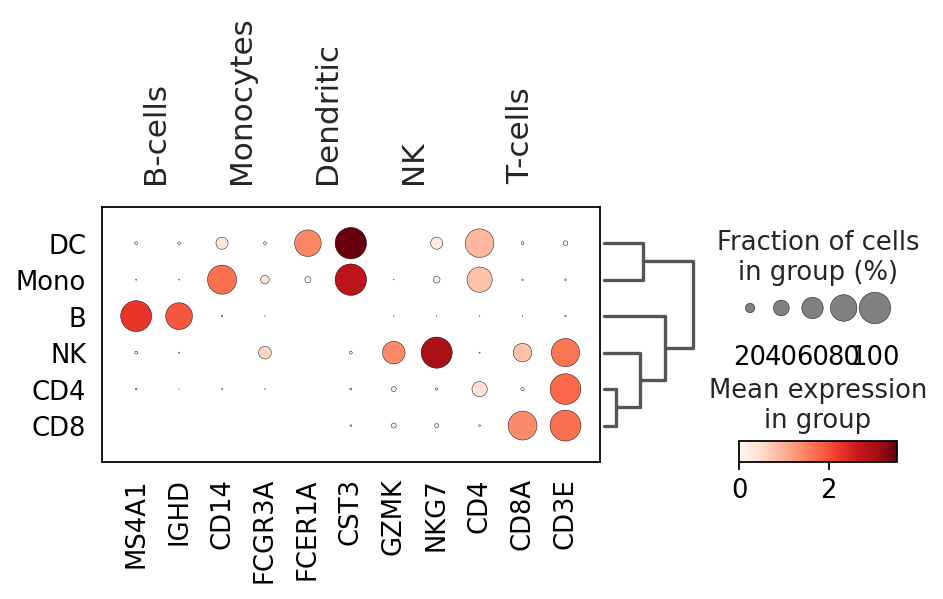

In [545]:
sc.pl.dotplot(adata, marker_genes_dict, 'cell_type', dendrogram=True)

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


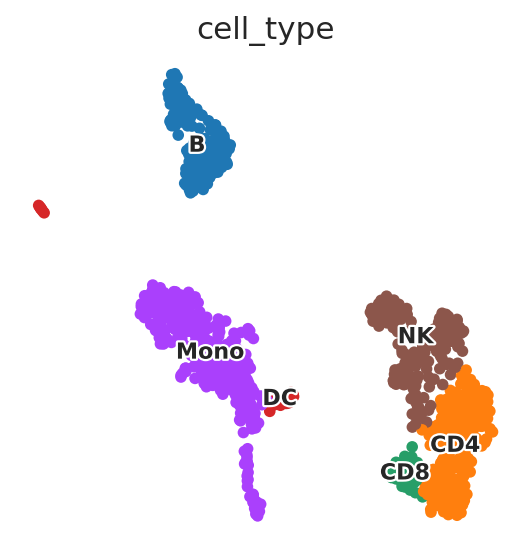

In [546]:
sc.pl.umap(
    adata,
    color='cell_type',
    legend_loc='on data',
    frameon=False,
    legend_fontsize=10,
    legend_fontoutline=2,
)

#### Stacked-violin plot

To simultaneously look at the violin plots for all marker genes we use `sc.pl.stacked_violin`. As previously, a dendrogram was added to group similar clusters.

categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


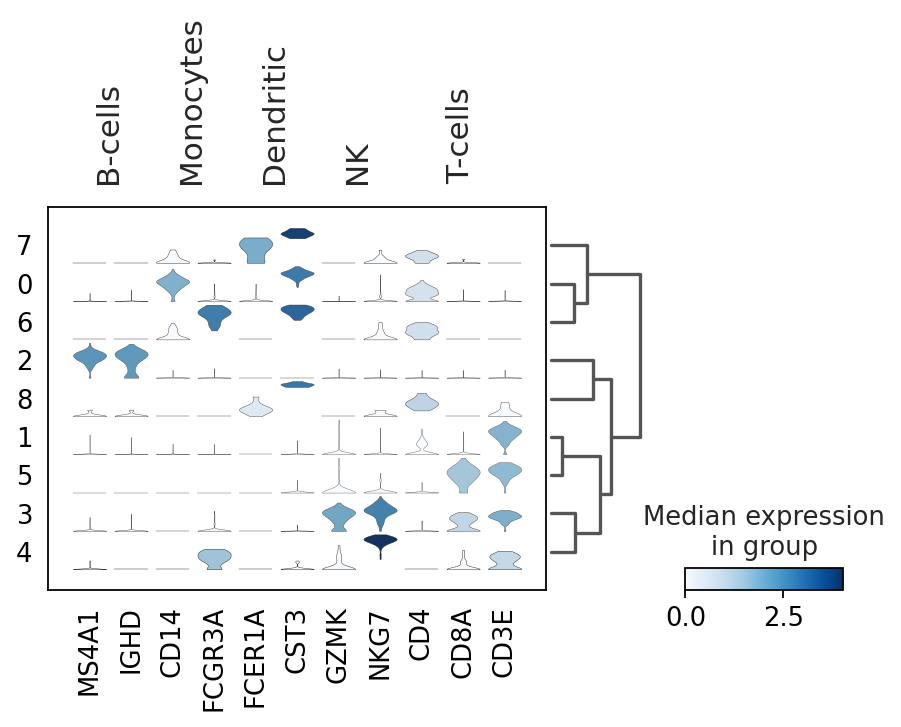

In [551]:
ax = sc.pl.stacked_violin(adata, marker_genes_dict, groupby='leiden', swap_axes=False, dendrogram=True)

#### Matrix plot

A simple way to visualize the expression of genes is with a `matrix plot`. This is a heatmap of the mean expression values per gene grouped by categories. This type plot basically shows the same information as the color in the dotplots.

Here, scale the expression of the genes from 0 to 1, being the maximum mean expression and 0 the minimum.

categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


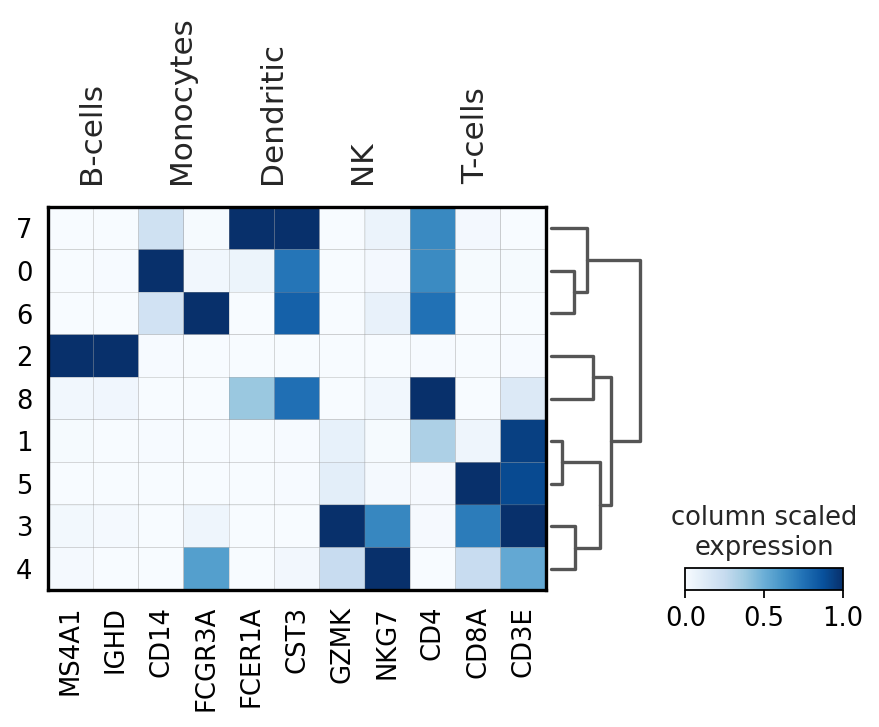

In [556]:
sc.pl.matrixplot(
    adata,
    marker_genes_dict,
    'leiden',
    dendrogram=True,
    cmap='Blues',
    standard_scale='var',
    use_raw=True,
    colorbar_title='column scaled\nexpression',
)

Other useful option is to normalize the gene expression using `sc.pp.scale`. Here we store this information under the `scale` layer. Afterwards we adjust the plot min and max and use a diverging color map (in this case `RdBu_r` where `_r` means reversed). 

In [560]:
# scale and store results in layer
adata.layers['scaled'] = sc.pp.scale(adata, copy=True).X

categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


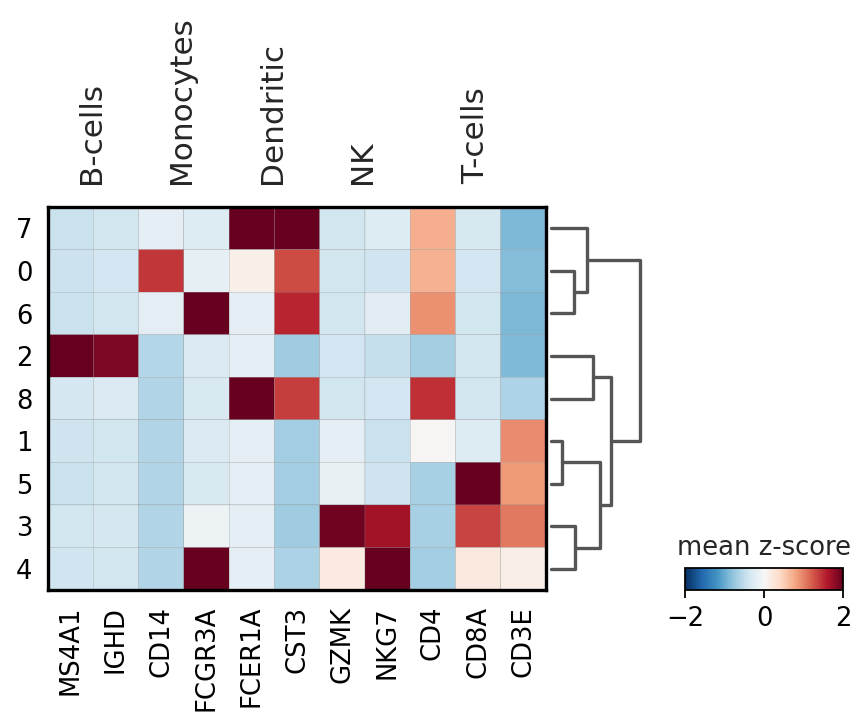

In [561]:
sc.pl.matrixplot(
    adata,
    marker_genes_dict,
    'leiden',
    dendrogram=True,
    colorbar_title='mean z-score',
    layer='scaled',
    vmin=-2,
    vmax=2,
    cmap='RdBu_r',
)

Note that as a result of the analysis the adata object has accumulated several annotations:

#### Combining plots

An `axis` can be passed to a plot to combine multiple outputs as in the following example

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


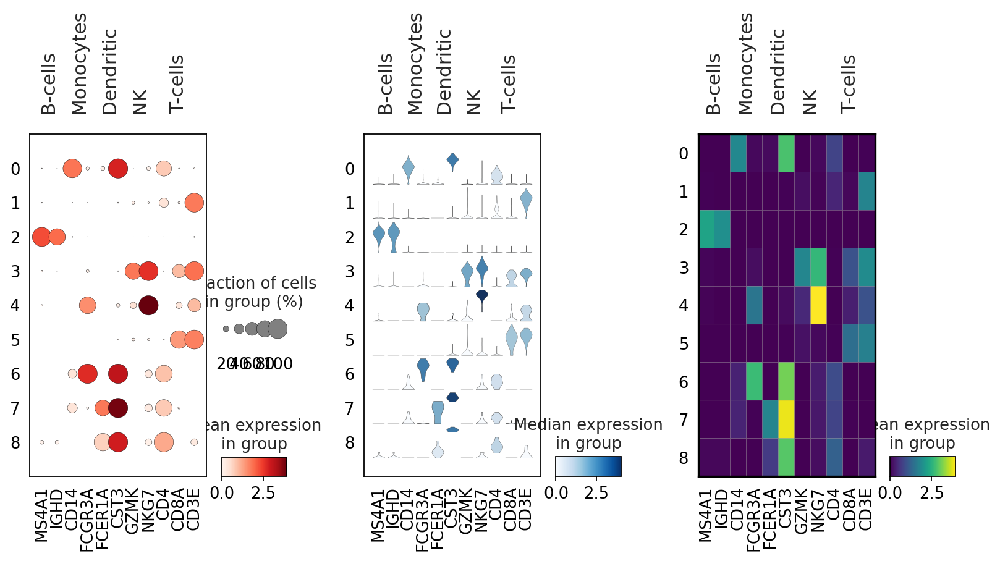

In [573]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,6), gridspec_kw={'wspace':0.3})

ax1_dict = sc.pl.dotplot(adata, marker_genes_dict, groupby='leiden', ax=ax1, show=False)
ax2_dict = sc.pl.stacked_violin(adata, marker_genes_dict, groupby='leiden', ax=ax2, show=False)
ax3_dict = sc.pl.matrixplot(adata, marker_genes_dict, groupby='leiden', ax=ax3, show=False, cmap='viridis')
# plt.tight_layout()

#### Heatmaps

Heatmaps do not collapse cells as in previous plots. Instead, each cells is shown in a row (or column if `swap_axes=True`). The groupby information can be added and is shown using the same color code found for `sc.pl.umap` or any other embedding.

categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


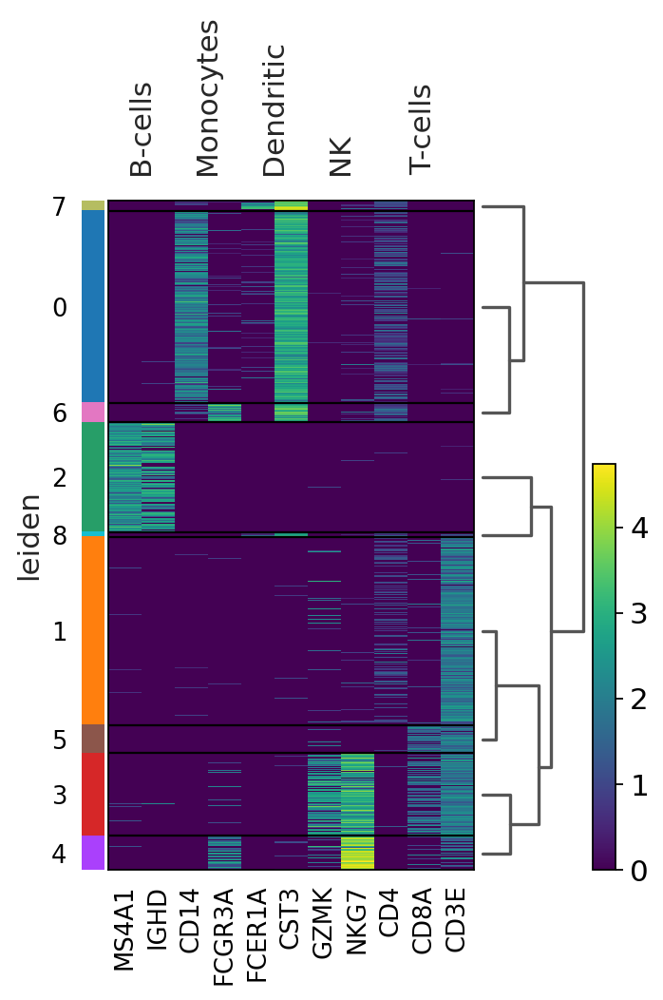

In [574]:
ax = sc.pl.heatmap(adata, marker_genes_dict, groupby='leiden', cmap='viridis', dendrogram=True)

The heatmap can also be plotted on scaled data. In the next image, similar to the previus matrixplot the min and max had been adjusted and a divergent color map is used.

categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


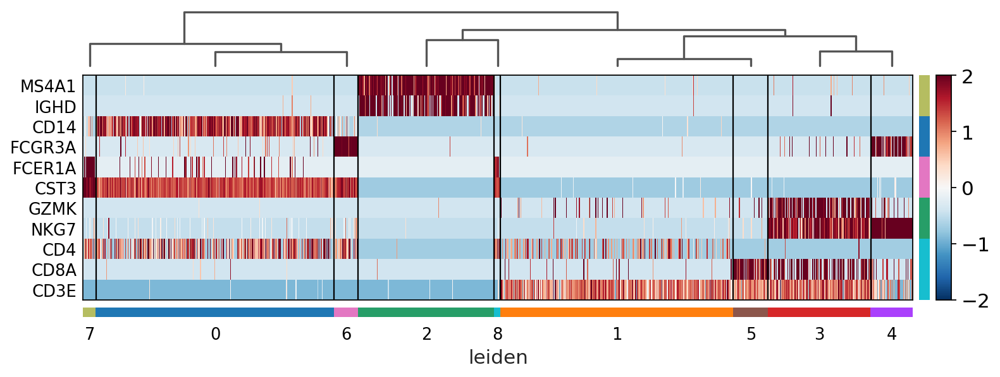

In [576]:
ax = sc.pl.heatmap(adata, marker_genes_dict, groupby='leiden', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', dendrogram=True, swap_axes=True, figsize=(11,4))

#### Tracksplot

The track plot shows the same information as the heatmap, but, instead of a color scale, the gene expression is represented by height.

categories: 0, 1, 2, etc.
var_group_labels: B-cells, Monocytes, Dendritic, etc.


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


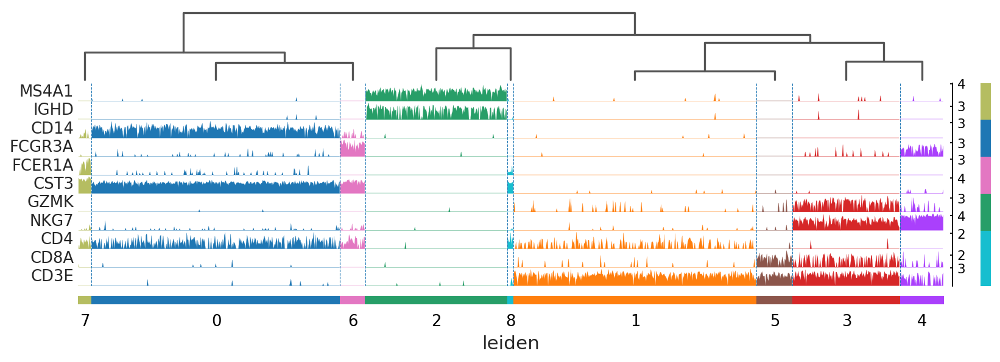

In [577]:
ax = sc.pl.tracksplot(adata, marker_genes_dict, groupby='leiden', dendrogram=True)

### Visualization of marker genes

Instead of characterizing clusters by known gene markers as previously, we can identify genes that are differentially expressed in the clusters or groups.

To identify differentially expressed genes we run `sc.tl.rank_genes_groups`. This function will take each group of cells and compare the distribution of each gene in a group against the distribution in all other cells not in the group. Here, we will use the original cell labels given by 10x to identify marker genes for those cell types.

In [578]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')

ranking genes
    finished (0:00:02)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


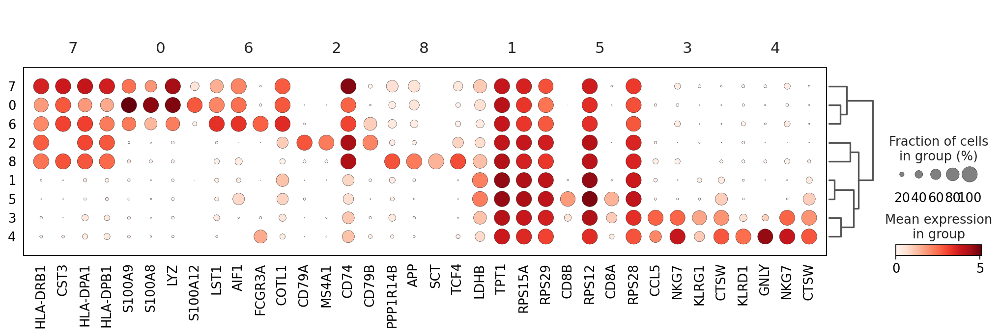

In [579]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4)

In order to get a better representation we can plot *log fold changes* instead of gene expression. Also, we want to focus on genes that have a log fold change >= 3 between the cell type expression and the rest of cells. 

In this case we set `values_to_plot='logfoldchanges'` and `min_logfoldchange=3`.

Because log fold change is a divergent scale we also adjust the min and max to be plotted and use a divergent color map. Notice in the following plot that is rather difficult to distinguish between T-cell populations.

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


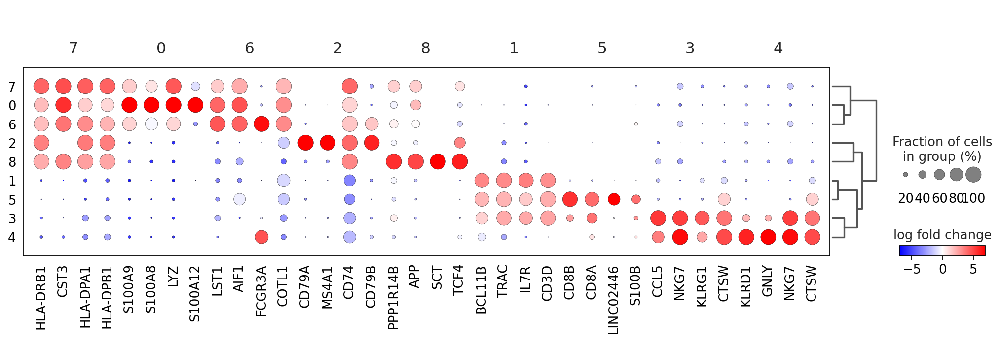

In [580]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4, values_to_plot='logfoldchanges', min_logfoldchange=3, vmax=7, vmin=-7, cmap='bwr')

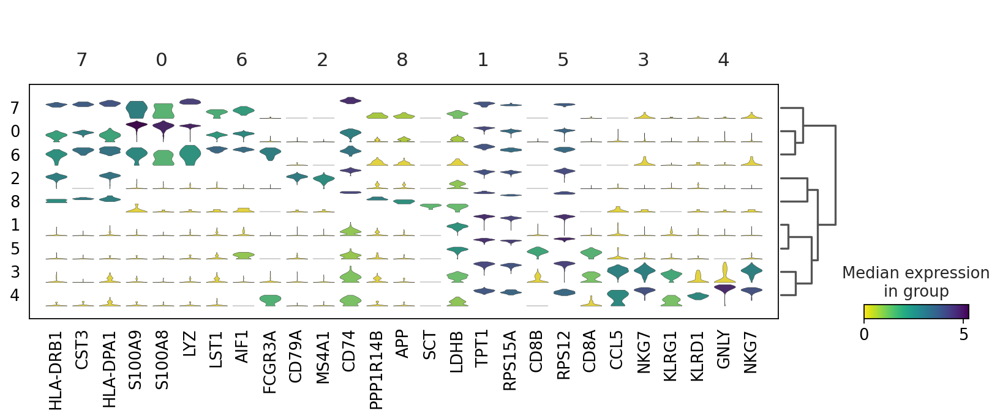

In [583]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=3, cmap='viridis_r')

Next, we use a dotplot focusing only on two groups (the groups option is also available for violin, heatmap and matrix plots). Here, we set `n_genes=30` as in this case it will show all the genes that have a `min_logfoldchange=4` up to 30.

categories: 0, 1, 2, etc.
var_group_labels: 1, 2


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


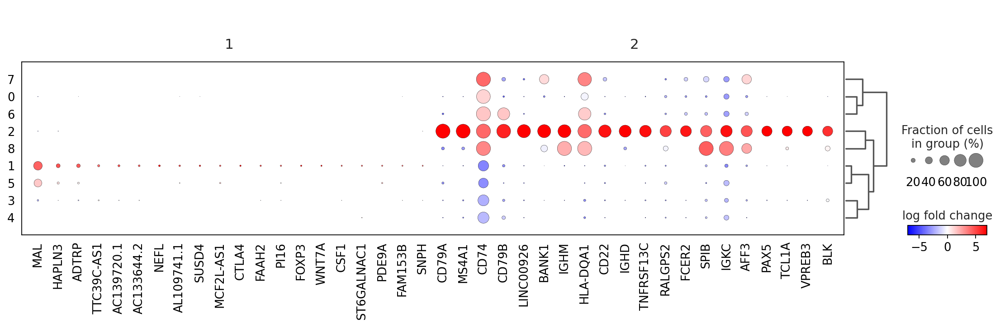

In [582]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=20,
    values_to_plot='logfoldchanges',
    min_logfoldchange=4,
    vmax=7,
    vmin=-7,
    cmap='bwr',
    groups=['1', '2'],
)

Visualizing marker genes using a heatmap

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


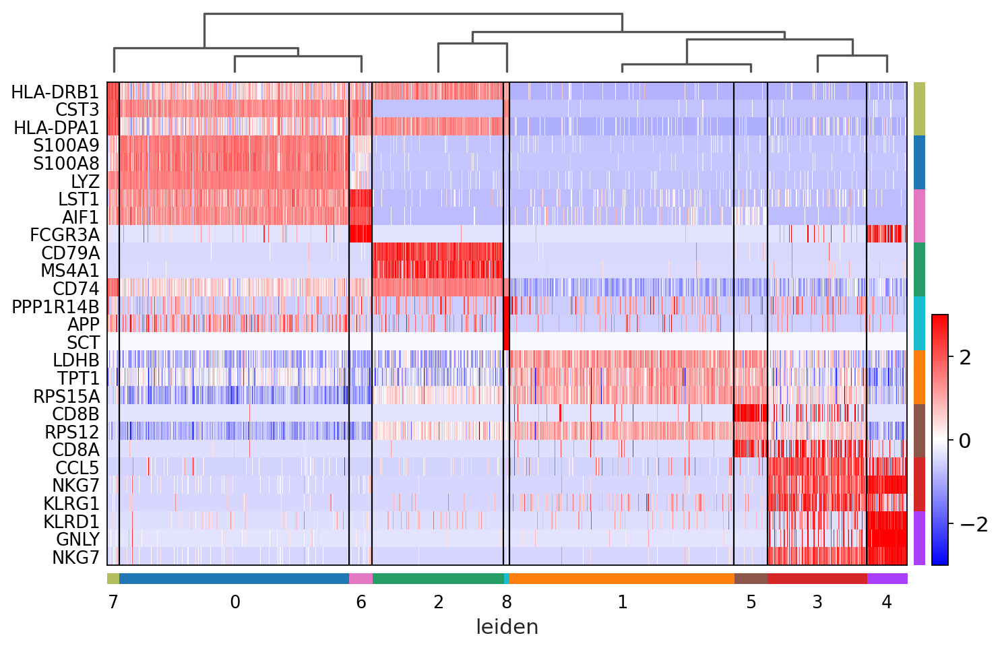

In [584]:
sc.pl.rank_genes_groups_heatmap(
    adata,
    n_genes=3,
    use_raw=False,
    swap_axes=True,
    vmin=-3,
    vmax=3,
    cmap='bwr',
    layer='scaled',
    figsize=(10,7),
    show=False
);

Showing 10 genes per category, turning the gene labels off and swapping the axes. Notice that when the image is swapped, a color code for the categories appear instead of the 'brackets'.

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


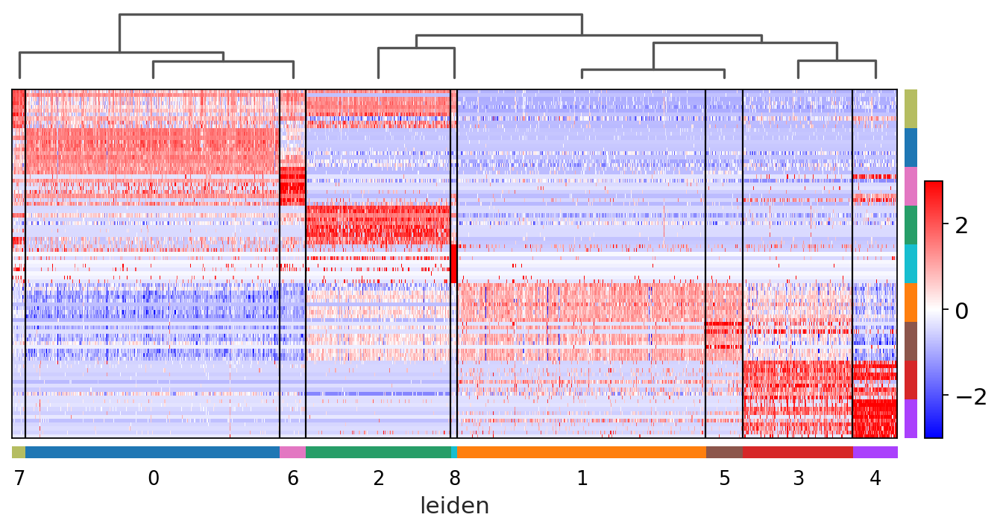

In [591]:
sc.pl.rank_genes_groups_heatmap(
    adata,
    n_genes=10,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False,
    vmin=-3,
    vmax=3,
    cmap='bwr',
)

Most of the visualizations can arrange the categories using a dendrogram. However, the dendrogram can also be plotted independently as follows:

In [592]:
# compute hierarchical clustering using PCs (several distance metrics and linkage methods are available).
sc.tl.dendrogram(adata, 'leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


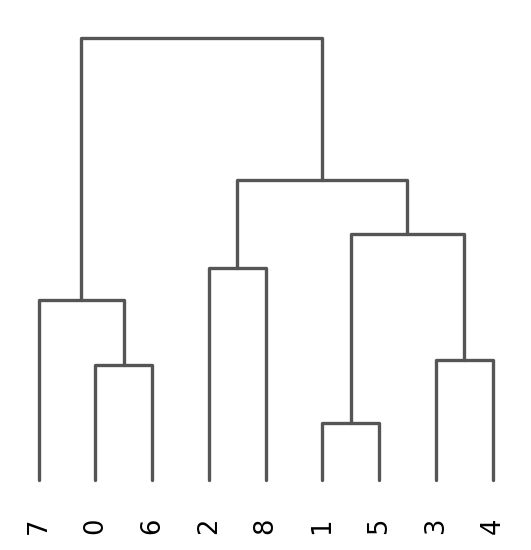

In [593]:
ax = sc.pl.dendrogram(adata, 'leiden')

Together with the dendrogram it is possible to plot the correlation (by default 'pearson') of the categories.

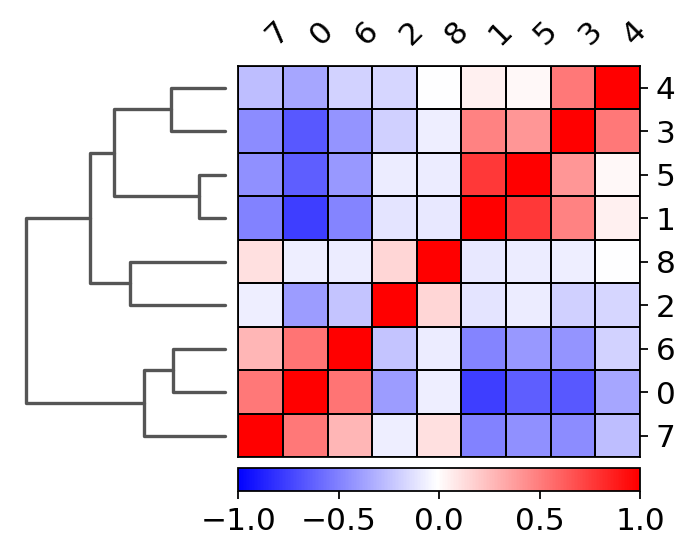

In [589]:
ax = sc.pl.correlation_matrix(adata, 'leiden', figsize=(5,3.5))

## scVI

We can see scVI like a non-linear PCA method.

### Creating a model

In [3]:
import scvi

Global seed set to 0
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


#### Preprocessing

In [117]:
# reload the data in the state prior to marker finding
adata = sc.read_10x_mtx(
    './output/counts_unfiltered/cellranger',
    var_names='gene_symbols',
    cache=False,
)

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/anndata/utils.py:111: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


In [118]:
adata

AnnData object with n_obs × n_vars = 250603 × 60623
    var: 'gene_ids'

Now we [preprocess the data](https://scanpy.readthedocs.io/en/stable/api/index.html#module-scanpy.pp) to remove, for example, genes that are very lowly expressed and other outliers (see previous sections).

In [119]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_counts=3)

filtered out 249396 cells that have less than 200 genes expressed
filtered out 36593 genes that are detected in less than 3 counts


In [68]:
adata

AnnData object with n_obs × n_vars = 1207 × 24030
    obs: 'n_genes'
    var: 'gene_ids', 'n_counts'

In [120]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

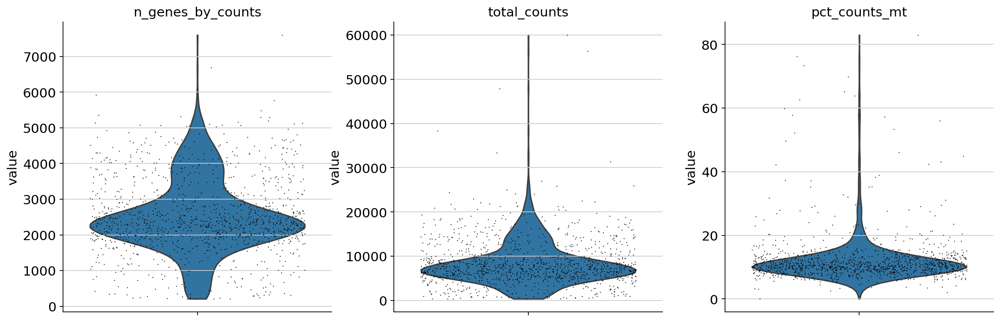

In [121]:
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True,
)

In [122]:
adata = adata[adata.obs.n_genes_by_counts > 500, :]
adata = adata[adata.obs.total_counts > 1000, :]
adata = adata[adata.obs.total_counts < 20000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]

In [71]:
adata

View of AnnData object with n_obs × n_vars = 1081 × 24030
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In scRNA-seq analysis, it's popular to normalize the data. These values are not used by scvi-tools, but given their popularity in other tasks as well as for visualization, we store them in the anndata object separately (via the `.raw` attribute). **Unless otherwise specified, scvi-tools models require the raw counts (not log library size normalized).**

In [123]:
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata # freeze the state in `.raw`

normalizing counts per cell
    finished (0:00:00)


Finally, we perform feature selection, to reduce the number of features (genes in this case) used as input to the scvi-tools model. For best practices of how/when to perform feature selection, please refer to the model-specific tutorial. For scVI, we recommend anywhere from 1,000 to 10,000 HVGs, but it will be context-dependent.

In [124]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=1200,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


Now it's time to run `setup_anndata()`, which alerts scvi-tools to the locations of various matrices inside the anndata. It's important to run this function with the correct arguments so scvi-tools is notified that your dataset has batches, annotations, etc. For example, if batches are registered with scvi-tools, the subsequent model will correct for batch effects. See the full documentation for details.

In this dataset, there is no categorical covariate (single sample). There could have been additional continuous covariates we'd liked to correct for, e.g., "percent_mito" and "percent_ribo". These covariates can be registered using the `categorical_covariate_keys` argument. If you only have one categorical covariate, you can also use the `batch_key` argument instead.

In [148]:
adata

AnnData object with n_obs × n_vars = 1081 × 1200
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling'
    var: 'gene_ids', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'dendrogram_leiden'
    obsm: '_scvi_extra_continuous_covs', 'X_scVI', 'X_umap'
    layers: 'counts', 'scvi_normalized'
    obsp: 'distances', 'connectivities'

In [149]:
# we can always go back to the initial state using `.raw`
adata.raw.to_adata()

AnnData object with n_obs × n_vars = 1081 × 24030
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling'
    var: 'gene_ids', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'dendrogram_leiden'
    obsm: '_scvi_extra_continuous_covs', 'X_scVI', 'X_umap'
    obsp: 'distances', 'connectivities'

#### SCVI model

In [28]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    # categorical_covariate_keys=["cell_source", "donor"],
    continuous_covariate_keys=['pct_counts_mt'],
    # continuous_covariate_keys=["percent_mito", "percent_ribo"],
)

In [29]:
model = scvi.model.SCVI(adata)

We can see an overview of the model by printing it.

In [30]:
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained

In [159]:
model.view_anndata_setup(adata)

Anndata setup with scvi-tools version 0.19.0.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': None,
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': ['pct_counts_mt']
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 1081  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   1   │
│         n_labels         │   1   │
│          n_vars          │ 1200  │
└──────────────────────────┴───────┘

                            Data Registry                            
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Registry Key      ┃            scvi-tools Location            ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X           │          adata.layers['counts']           │
│         batch         │         adata.obs['_scvi_batch']          │
│ extra_continuous_covs │ adata.obsm['_scvi_extra_continuous_covs'] │
│        labels         │         adata.obs['_scvi_labels']         │
└───────────────────────┴───────────────────────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

 extra_continuous_covs State  
           Registry           
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['pct_counts_mt'] │
└────────────────────────────┘

Note - All scvi-tools models run faster when using a GPU. By default, scvi-tools will use a GPU if one is found to be available. Please see the installation page for more information about installing scvi-tools when a GPU is available.

In [31]:
model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/pytorch_lightning/trainer/trainer.py:1892: PossibleUserWarning: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 400/400: 100%|██████████| 400/400 [02:02<00:00,  1.64it/s, loss=556, v_num=1] 

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:02<00:00,  3.26it/s, loss=556, v_num=1]


We can save the model for later use.

In [32]:
model.save("my_model/", overwrite=True)

In [158]:
# model = scvi.model.SCVI.load("my_model/", adata=adata, use_gpu=False)

INFO     File my_model/model.pt already downloaded                                                                 


In [126]:
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained

It's often useful to store the outputs of scvi-tools back into the original anndata, as it permits interoperability with Scanpy.

In [127]:
latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent # obsm slot contains the same number of cells as X
# the obsm slots are used for UMAP

The `model.get...()` functions default to using the anndata that was used to initialize the model. It's possible to also query a subset of the anndata, or even use a completely independent anndata object as long as the anndata is organized in an equivalent fashion.

```python
adata_subset = adata[adata.obs.cell_type == "Fibroblast"]
latent_subset = model.get_latent_representation(adata_subset)

denoised = model.get_normalized_expression(adata_subset, library_size=1e4)
denoised.iloc[:5, :5]
```

Let's store the normalized values back in the anndata.

In [128]:
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=1e4
)

Scanpy is a powerful python library for visualization and downstream analysis of scRNA-seq data. We show here how to feed the objects produced by scvi-tools into a scanpy workflow.

_We use UMAP to qualitatively assess our low-dimension embeddings of cells. We do not advise using UMAP or any similar approach quantitatively. We do recommend using the embeddings produced by scVI as a plug-in replacement of what you would get from PCA, as we show below._

#### Interoperability with Scanpy

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:01)
computing UMAP
    finished (0:00:02)
running Leiden clustering
    finished (0:00:00)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


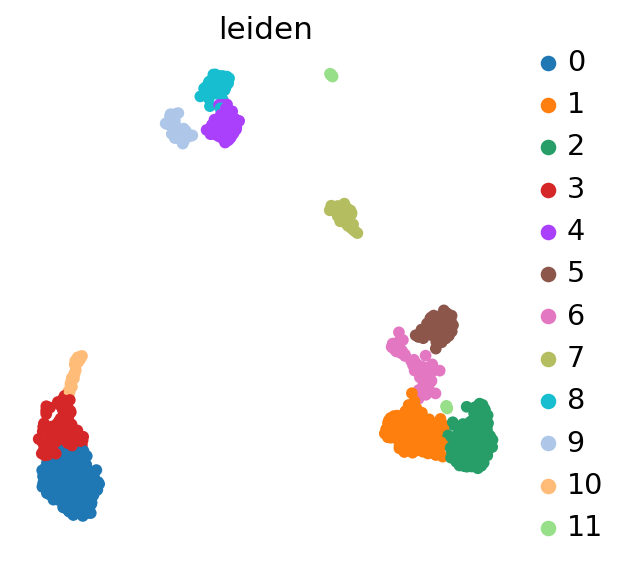

In [35]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)
sc.tl.leiden(adata)
sc.pl.umap(
    adata,
    color=["leiden"],
    frameon=False,
)

#### Clustering on the scVI latent space

In [129]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

computing neighbors
    finished (0:00:00)
computing UMAP
    finished (0:00:02)


In [130]:
sc.tl.leiden(adata, resolution=0.7)

running Leiden clustering
    finished (0:00:00)


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


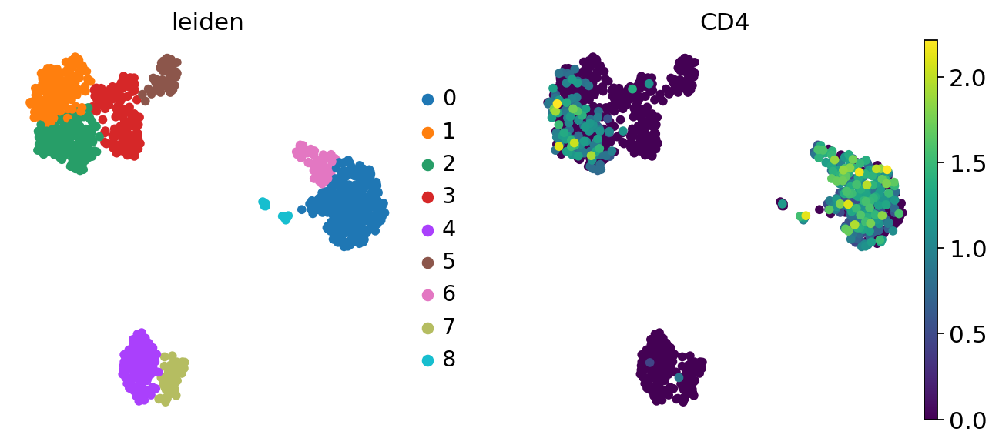

In [131]:
sc.pl.umap(adata, color = ['leiden', 'CD4'], frameon = False)

#### Differential expression

We can also use many scvi-tools models for differential expression. For further details on the methods underlying these functions as well as additional options, please see the [API docs](https://docs.scvi-tools.org/en/stable/api/reference/scvi.model.SCVI.differential_expression.html#scvi.model.SCVI.differential_expression).

In [132]:
scvi_de = model.differential_expression(
    idx1 = [adata.obs['leiden'] == '0'],
    idx2 = [adata.obs['leiden'] == '4']
    )

DE...: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


In [81]:
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05
MS4A1,1.0000,0.0000,18.420681,0.000269,0.010496,0.0,0.25,-5.547513,-5.573075,1.022620,-8.828970,-0.868235,0.006897,6.101562,0.006897,1.000000,0.021937,117.201118,True
P2RX5,1.0000,0.0000,18.420681,0.000032,0.001990,0.0,0.25,-6.253054,-6.252202,1.476886,-11.481015,-0.285536,0.013793,1.078125,0.013793,0.562500,0.037383,19.932564,True
CD79A,1.0000,0.0000,18.420681,0.000229,0.017583,0.0,0.25,-6.839011,-6.898570,1.351946,-11.996256,-1.651576,0.013793,10.679688,0.013793,0.992188,0.040489,195.723480,True
TYROBP,1.0000,0.0000,18.420681,0.005409,0.000309,0.0,0.25,4.288919,4.280624,0.767055,1.627104,6.879119,14.668962,0.007812,0.996552,0.007812,54.040951,0.094812,True
FCRL1,1.0000,0.0000,18.420681,0.000037,0.002517,0.0,0.25,-6.425223,-6.389289,1.454805,-11.193786,-2.188099,0.010345,1.218750,0.010345,0.648438,0.025890,23.488968,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UBE2J1,0.7124,0.2876,0.907069,0.000526,0.000538,0.0,0.25,0.008327,0.008966,0.678901,-2.537145,2.715955,1.275860,0.273438,0.682759,0.226562,5.013632,4.986475,False
ACTG1,0.6920,0.3080,0.809486,0.007807,0.009433,0.0,0.25,-0.255182,-0.252332,0.601436,-2.424726,2.761929,22.934483,5.742188,1.000000,0.921875,81.875336,99.769241,False
ACTB,0.6614,0.3386,0.669539,0.029601,0.024765,0.0,0.25,0.284443,0.288879,0.471918,-1.268974,2.242262,91.906921,16.312500,1.000000,1.000000,335.276123,287.872253,False
TMSB4X,0.6478,0.3522,0.609383,0.027743,0.035265,0.0,0.25,-0.336098,-0.325830,0.412929,-1.924212,1.187144,90.224106,25.914062,1.000000,1.000000,324.455994,469.251923,False


Let's filter based on significant DEGs.

In [133]:
scvi_de = scvi_de[(scvi_de['is_de_fdr_0.05']) & (abs(scvi_de.lfc_mean) > 2)]
scvi_de = scvi_de.sort_values('lfc_mean')
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05
LINC00926,1.0000,0.0000,18.420681,0.000035,6.607762e-03,0.0,0.25,-8.039257,-8.001652,1.474919,-13.666214,-3.527587,0.013793,3.695312,0.013793,0.914062,0.059834,72.111893,True
IGKC,1.0000,0.0000,18.420681,0.000179,3.841506e-02,0.0,0.25,-8.022813,-8.124182,1.226141,-11.572458,-2.397411,0.293104,31.984375,0.248276,0.710938,1.072724,567.230713,True
FCER2,1.0000,0.0000,18.420681,0.000025,4.312271e-03,0.0,0.25,-7.833242,-7.875838,1.604949,-14.749502,-1.626005,0.065517,2.234375,0.055172,0.796875,0.199330,41.839020,True
IGHM,1.0000,0.0000,18.420681,0.000339,4.089287e-02,0.0,0.25,-7.672296,-7.701540,1.631465,-14.310688,-1.964285,0.013793,26.898438,0.013793,0.992188,0.069396,501.742767,True
CD22,1.0000,0.0000,18.420681,0.000040,4.664082e-03,0.0,0.25,-7.351959,-7.329111,1.447694,-12.739833,-2.989831,0.017241,2.421875,0.017241,0.835938,0.094965,44.007736,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OLFM1,0.9998,0.0002,8.516943,0.000244,2.141695e-06,0.0,0.25,6.988392,7.008561,1.952755,-0.606453,14.237661,0.293104,0.000000,0.158621,0.000000,0.972707,0.000000,True
S100A9,0.9988,0.0012,6.724225,0.055072,4.592017e-04,0.0,0.25,7.233943,7.267887,1.471977,-0.909939,12.328585,231.693115,0.101562,0.993103,0.062500,798.221802,1.603926,True
LYZ,1.0000,0.0000,18.420681,0.045152,3.691381e-04,0.0,0.25,7.257393,7.194000,1.084696,3.557131,11.119347,149.537918,0.085938,1.000000,0.085938,536.510742,1.409070,True
MARCO,0.9986,0.0014,6.569875,0.000126,8.142076e-07,0.0,0.25,7.278665,7.379103,2.275841,-2.318445,16.025482,0.337931,0.000000,0.231034,0.000000,1.085378,0.000000,True


We can plot a heatmap based on the previous table ordered acc. `lfc_mean`.

In [134]:
genes_to_show = scvi_de[-25:].index.tolist() + scvi_de[:25].index.tolist() #top 25 and bottom 25 from sorted df

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


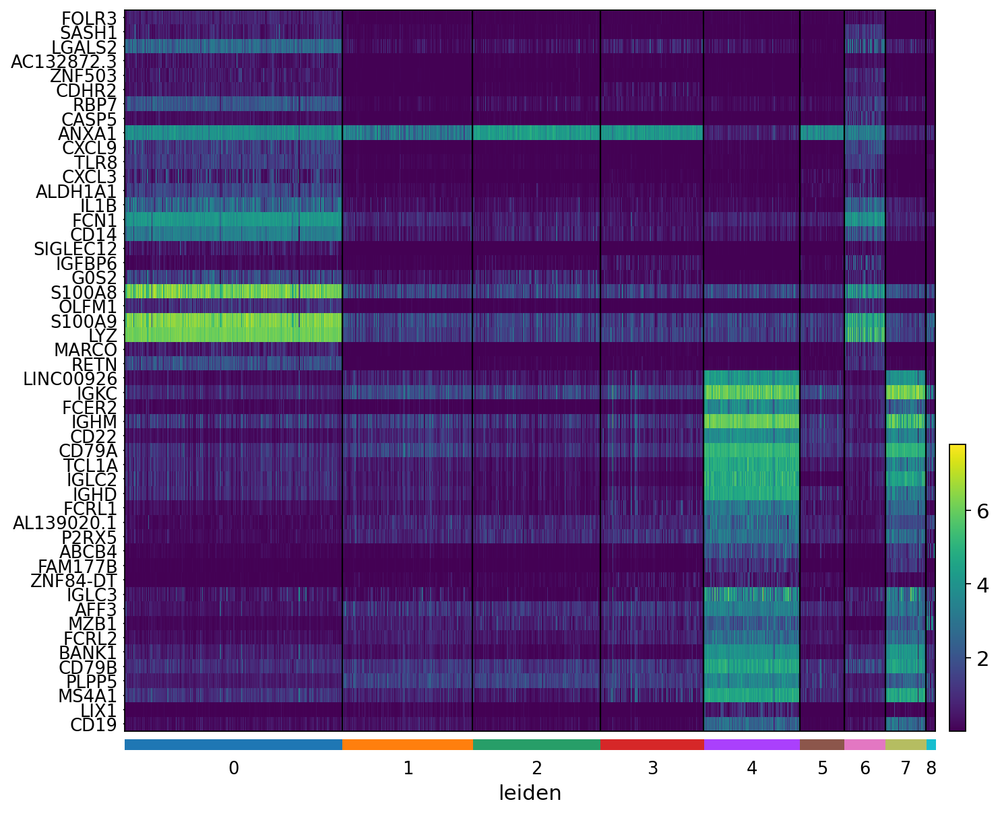

In [135]:
sc.pl.heatmap(adata, genes_to_show, groupby='leiden', swap_axes=True, layer = 'scvi_normalized', log = True)

We can also do a 1-vs-all DE test, which compares each cluster/cell type with the rest of the dataset.

In [136]:
de_df = model.differential_expression(
    groupby="leiden", # could be any categorical key
)
de_df.head()

DE...: 100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
S100A9,0.9984,0.0016,6.436144,0.054866,0.001328,0.0,0.25,6.911946,7.126635,2.072462,...,231.693115,3.414668,0.993103,0.155499,798.221802,11.845987,True,0 vs Rest,0,Rest
VCAN,0.9982,0.0018,6.318161,0.006461,0.000301,0.0,0.25,5.120944,5.068521,1.765195,...,18.462063,0.294564,0.986207,0.056890,67.613113,1.094685,True,0 vs Rest,0,Rest
S100A8,0.9980,0.0020,6.212601,0.052216,0.000918,0.0,0.25,6.777308,6.930217,1.985300,...,155.544891,1.448799,0.989655,0.103666,612.199463,4.996326,True,0 vs Rest,0,Rest
S100A12,0.9966,0.0034,5.680571,0.008487,0.000323,0.0,0.25,5.242552,5.252672,2.203808,...,23.362070,0.184577,0.972414,0.039191,86.239883,0.614291,True,0 vs Rest,0,Rest
CD14,0.9958,0.0042,5.468460,0.002762,0.000143,0.0,0.25,5.547545,5.613842,2.219272,...,7.210346,0.190898,0.941379,0.050569,26.007570,0.719410,True,0 vs Rest,0,Rest


We then extract top markers for each cluster using the DE results.

In [137]:
markers = {}
cats = adata.obs.leiden.cat.categories
for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = de_df.loc[de_df.comparison == cid]
    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]
    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    markers[c] = cell_type_df.index.tolist()[:3]

In [138]:
sc.tl.dendrogram(adata, groupby="leiden", use_rep="X_scVI")

Storing dendrogram info using `.uns['dendrogram_leiden']`


/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


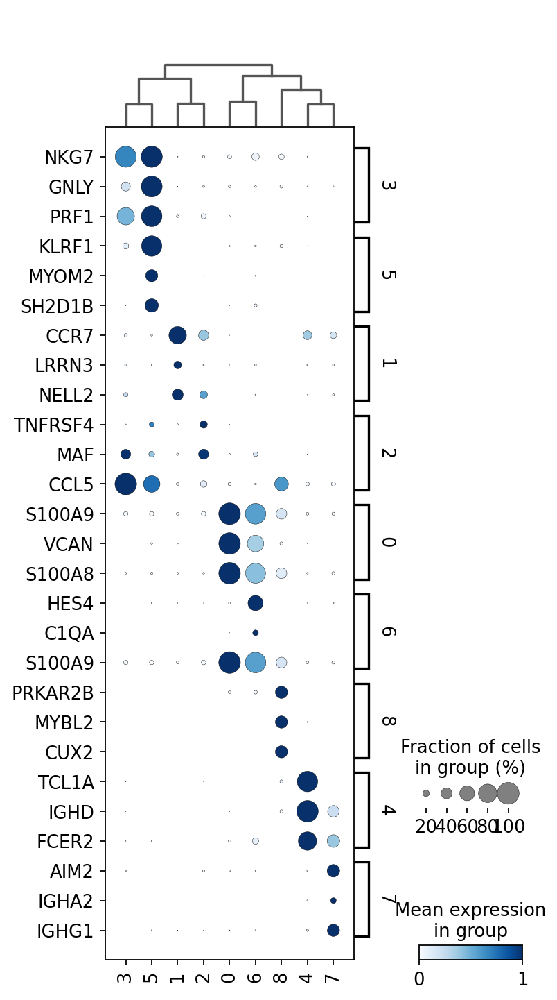

In [139]:
sc.pl.dotplot(
    adata,
    markers,
    groupby='leiden',
    dendrogram=True,
    color_map="Blues",
    swap_axes=True,
    use_raw=True,
    standard_scale="var",
)

We can also visualize the scVI normalized gene expression values with the `layer` option.

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


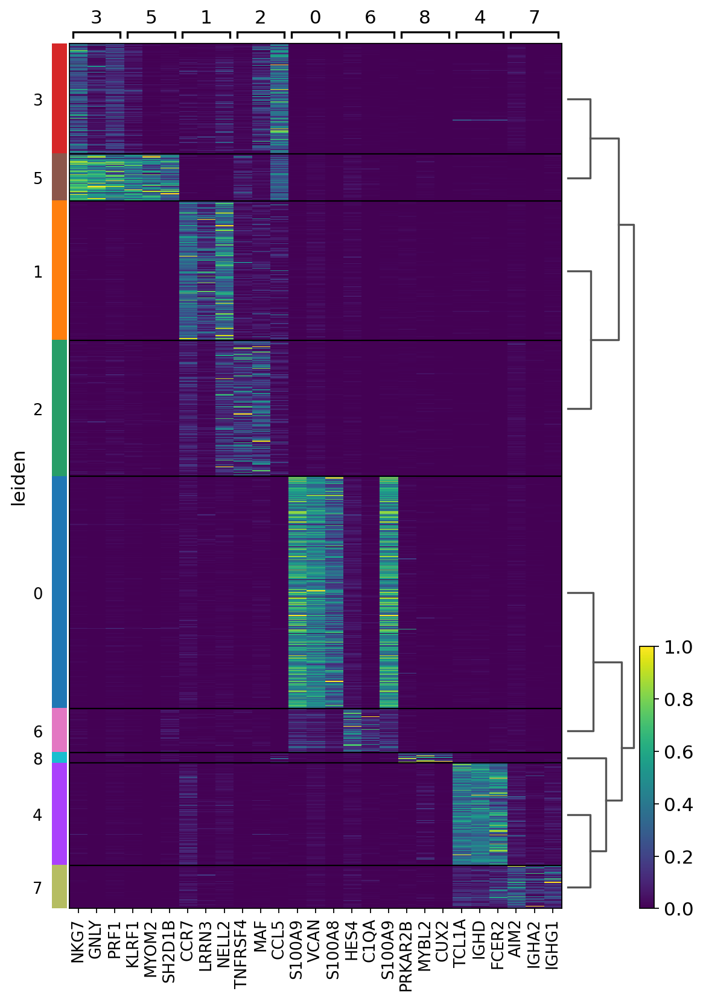

In [140]:
sc.pl.heatmap(
    adata,
    markers,
    groupby='leiden',
    layer="scvi_normalized",
    standard_scale="var",
    dendrogram=True,
    figsize=(8, 12)
)

### Annotation with CellAssign

CellAssign is a probabilistic model that uses prior knowledge of cell-type marker genes to annotate scRNA data into predefined cell types. Unlike other methods for assigning cell types, CellAssign does not require labeled single cell data and only needs to know whether or not each given gene is a marker of each cell type. The original paper and R code are linked below.

Paper: [Probabilistic cell-type assignment of single-cell RNA-seq for tumor microenvironment profiling, *Nature Methods 2019*](https://www.nature.com/articles/s41592-019-0529-1)

Code: https://github.com/Irrationone/cellassign

In [141]:
marker_gene_mat = pd.read_csv('./immune_celltype_matrix.csv', index_col=0)

The anndata object and cell type marker matrix should contain the same genes, so we index into adata to include only the genes from marker_gene_mat.

In [142]:
bdata = adata[:, marker_gene_mat.index].copy()

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


For the construction of a marker gene matrix, see details [elsewhere](https://irrationone.github.io/cellassign/articles/introduction-to-cellassign.html#constructing-a-marker-gene-matrix).

Then we setup anndata and initialize a CellAssign model (this step was already done in the previous section here). Here we set the size_factor_key to "size_factor", which is a column in bdata.obs. A size factor may be defined manually as scaled library size (total UMI count) and should not be placed on the log scale, as the model will do this manually. The library size should be computed **before** any gene subsetting (in this case, technically, a few notebook cells up).

In [143]:
lib_size = adata.X.sum(1)
bdata.obs["size_factor"] = lib_size / np.mean(lib_size)

In [144]:
scvi.external.CellAssign.setup_anndata(bdata, size_factor_key="size_factor")

/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/scvi/data/fields/_layer_field.py:91: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [147]:
from scvi.external import CellAssign
model = CellAssign(bdata, marker_gene_mat)
model.train(train_size=0.5, use_gpu=False)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/pytorch_lightning/trainer/configuration_validator.py:258: LightningDeprecationWarning: The `Callback.on_batch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `Callback.on_train_batch_end` instead.
  rank_zero_deprecation(
/home/sebastien/kallistobustools/.env_scanpy/lib/python3.8/site-packages/pytorch_lightning/trainer/trainer.py:1892: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

RuntimeError: The size of tensor a (18) must match the size of tensor b (20) at non-singleton dimension 0